# Objective : 

     To Perform Exploratory Data Analysis (EDA) on the data-set released by dataset was released by Aspiring Minds from the Aspiring Mind Employment Outcome 2015 (AMEO) by consider Salary as a target variable
     
# Research Question:

       Times of India article dated Jan 18, 2019 states that “After doing your Computer Science Engineering if you take up jobs as a Programming Analyst, Software Engineer, Hardware Engineer and Associate Engineer you can earn up to 2.5-3 lakhs as a fresh graduate.” Testing this claim with the data released by Aspiring Minds.


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as st
import warnings
warnings.filterwarnings('ignore')
from scipy.stats import norm,t

In [2]:
# loading the dataset

df = pd.read_excel(r"D:\Intership\task_4\data.xlsx")

In [3]:
df

,Unnamed: 0,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,train,203097,420000,2012-06-01,present,senior quality engineer,Bangalore,f,1990-02-19,84.30,...,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,train,579905,500000,2013-09-01,present,assistant manager,Indore,m,1989-10-04,85.40,...,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,train,810601,325000,2014-06-01,present,systems engineer,Chennai,f,1992-08-03,85.00,...,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,train,267447,1100000,2011-07-01,present,senior software engineer,Gurgaon,m,1989-12-05,85.60,...,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,train,343523,200000,2014-03-01,2015-03-01 00:00:00,get,Manesar,m,1991-02-27,78.00,...,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3993,train,47916,280000,2011-10-01,2012-10-01 00:00:00,software engineer,New Delhi,m,1987-04-15,52.09,...,-1,-1,-1,-1,-1,-0.1082,0.3448,0.2366,0.64980,-0.9194
3994,train,752781,100000,2013-07-01,2013-07-01 00:00:00,technical writer,Hyderabad,f,1992-08-27,90.00,...,-1,-1,-1,-1,-1,-0.3027,0.8784,0.9322,0.77980,-0.0943
3995,train,355888,320000,2013-07-01,present,associate software engineer,Bangalore,m,1991-07-03,81.86,...,-1,-1,-1,-1,-1,-1.5765,-1.5273,-1.5051,-1.31840,-0.7615
3996,train,947111,200000,2014-07-01,2015-01-01 00:00:00,software developer,Asifabadbanglore,f,1992-03-20,78.72,...,438,-1,-1,-1,-1,-0.1590,0.0459,-0.4511,-0.36120,-0.0943


In [4]:
df.shape

(3998, 39)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3998 entries, 0 to 3997
Data columns (total 39 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   Unnamed: 0             3998 non-null   object        
 1   ID                     3998 non-null   int64         
 2   Salary                 3998 non-null   int64         
 3   DOJ                    3998 non-null   datetime64[ns]
 4   DOL                    3998 non-null   object        
 5   Designation            3998 non-null   object        
 6   JobCity                3998 non-null   object        
 7   Gender                 3998 non-null   object        
 8   DOB                    3998 non-null   datetime64[ns]
 9   10percentage           3998 non-null   float64       
 10  10board                3998 non-null   object        
 11  12graduation           3998 non-null   int64         
 12  12percentage           3998 non-null   float64       
 13  12b

### About the dataset:

        The dataset contains the employment outcomes of engineering graduates.The dataset  contains  around 37 independent variables and 3998 data points

In [6]:
pd.set_option('display.max_columns', None)

In [7]:
df

,Unnamed: 0,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,12graduation,12percentage,12board,CollegeID,CollegeTier,Degree,Specialization,collegeGPA,CollegeCityID,CollegeCityTier,CollegeState,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,train,203097,420000,2012-06-01,present,senior quality engineer,Bangalore,f,1990-02-19,84.30,"board ofsecondary education,ap",2007,95.80,"board of intermediate education,ap",1141,2,B.Tech/B.E.,computer engineering,78.00,1141,0,Andhra Pradesh,2011,515,585,525,0.635979,445,-1,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,train,579905,500000,2013-09-01,present,assistant manager,Indore,m,1989-10-04,85.40,cbse,2007,85.00,cbse,5807,2,B.Tech/B.E.,electronics and communication engineering,70.06,5807,0,Madhya Pradesh,2012,695,610,780,0.960603,-1,466,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,train,810601,325000,2014-06-01,present,systems engineer,Chennai,f,1992-08-03,85.00,cbse,2010,68.20,cbse,64,2,B.Tech/B.E.,information technology,70.00,64,0,Uttar Pradesh,2014,615,545,370,0.450877,395,-1,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,train,267447,1100000,2011-07-01,present,senior software engineer,Gurgaon,m,1989-12-05,85.60,cbse,2007,83.60,cbse,6920,1,B.Tech/B.E.,computer engineering,74.64,6920,1,Delhi,2011,635,585,625,0.974396,615,-1,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,train,343523,200000,2014-03-01,2015-03-01 00:00:00,get,Manesar,m,1991-02-27,78.00,cbse,2008,76.80,cbse,11368,2,B.Tech/B.E.,electronics and communication engineering,73.90,11368,0,Uttar Pradesh,2012,545,625,465,0.124502,-1,233,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3993,train,47916,280000,2011-10-01,2012-10-01 00:00:00,software engineer,New Delhi,m,1987-04-15,52.09,cbse,2006,55.50,cbse,6268,2,B.Tech/B.E.,information technology,61.50,6268,0,Haryana,2010,365,334,475,0.276047,345,-1,-1,-1,-1,-1,-1,-0.1082,0.3448,0.2366,0.64980,-0.9194
3994,train,752781,100000,2013-07-01,2013-07-01 00:00:00,technical writer,Hyderabad,f,1992-08-27,90.00,state board,2009,93.00,state board,4883,2,B.Tech/B.E.,electronics and communication engineering,77.30,4883,1,Telangana,2013,415,410,535,0.881620,325,420,-1,-1,-1,-1,-1,-0.3027,0.8784,0.9322,0.77980,-0.0943
3995,train,355888,320000,2013-07-01,present,associate software engineer,Bangalore,m,1991-07-03,81.86,"bse,odisha",2008,65.50,"chse,odisha",9786,2,B.Tech/B.E.,computer engineering,70.00,9786,0,Orissa,2012,475,475,465,0.488348,405,-1,-1,-1,-1,-1,-1,-1.5765,-1.5273,-1.5051,-1.31840,-0.7615
3996,train,947111,200000,2014-07-01,2015-01-01 00:00:00,software developer,Asifabadbanglore,f,1992-03-20,78.72,state board,2010,69.88,state board,979,2,B.Tech/B.E.,computer science & engineering,70.42,979,1,Karnataka,2014,450,410,320,0.744758,445,-1,438,-1,-1,-1,-1,-0.1590,0.0459,-0.4511,-0.36120,-0.0943


In [8]:
# printing column names and changing them to lowercase

df.columns = df.columns.str.lower()

# drop 'unnamed: 0' column from the dataset

df.drop('unnamed: 0', axis=1,inplace=True)

In [9]:
df.columns

Index(['id', 'salary', 'doj', 'dol', 'designation', 'jobcity', 'gender', 'dob',
       '10percentage', '10board', '12graduation', '12percentage', '12board',
       'collegeid', 'collegetier', 'degree', 'specialization', 'collegegpa',
       'collegecityid', 'collegecitytier', 'collegestate', 'graduationyear',
       'english', 'logical', 'quant', 'domain', 'computerprogramming',
       'electronicsandsemicon', 'computerscience', 'mechanicalengg',
       'electricalengg', 'telecomengg', 'civilengg', 'conscientiousness',
       'agreeableness', 'extraversion', 'nueroticism',
       'openess_to_experience'],
      dtype='object')

In [10]:
df['specialization'].unique()

array(['computer engineering',
       'electronics and communication engineering',
       'information technology', 'computer science & engineering',
       'mechanical engineering', 'electronics and electrical engineering',
       'electronics & telecommunications',
       'instrumentation and control engineering', 'computer application',
       'electronics and computer engineering', 'electrical engineering',
       'applied electronics and instrumentation',
       'electronics & instrumentation eng',
       'information science engineering', 'civil engineering',
       'mechanical and automation', 'industrial & production engineering',
       'control and instrumentation engineering',
       'metallurgical engineering',
       'electronics and instrumentation engineering',
       'electronics engineering', 'ceramic engineering',
       'chemical engineering', 'aeronautical engineering', 'other',
       'biotechnology', 'embedded systems technology',
       'electrical and power engi

In [11]:
df[df['specialization'].str.contains("electronics")]['specialization'].unique()

array(['electronics and communication engineering',
       'electronics and electrical engineering',
       'electronics & telecommunications',
       'electronics and computer engineering',
       'applied electronics and instrumentation',
       'electronics & instrumentation eng',
       'electronics and instrumentation engineering',
       'electronics engineering', 'electronics'], dtype=object)

In [12]:
df.select_dtypes(exclude=['int','float'])

,doj,dol,designation,jobcity,gender,dob,10board,12board,degree,specialization,collegestate
0,2012-06-01,present,senior quality engineer,Bangalore,f,1990-02-19,"board ofsecondary education,ap","board of intermediate education,ap",B.Tech/B.E.,computer engineering,Andhra Pradesh
1,2013-09-01,present,assistant manager,Indore,m,1989-10-04,cbse,cbse,B.Tech/B.E.,electronics and communication engineering,Madhya Pradesh
2,2014-06-01,present,systems engineer,Chennai,f,1992-08-03,cbse,cbse,B.Tech/B.E.,information technology,Uttar Pradesh
3,2011-07-01,present,senior software engineer,Gurgaon,m,1989-12-05,cbse,cbse,B.Tech/B.E.,computer engineering,Delhi
4,2014-03-01,2015-03-01 00:00:00,get,Manesar,m,1991-02-27,cbse,cbse,B.Tech/B.E.,electronics and communication engineering,Uttar Pradesh
...,...,...,...,...,...,...,...,...,...,...,...
3993,2011-10-01,2012-10-01 00:00:00,software engineer,New Delhi,m,1987-04-15,cbse,cbse,B.Tech/B.E.,information technology,Haryana
3994,2013-07-01,2013-07-01 00:00:00,technical writer,Hyderabad,f,1992-08-27,state board,state board,B.Tech/B.E.,electronics and communication engineering,Telangana
3995,2013-07-01,present,associate software engineer,Bangalore,m,1991-07-03,"bse,odisha","chse,odisha",B.Tech/B.E.,computer engineering,Orissa
3996,2014-07-01,2015-01-01 00:00:00,software developer,Asifabadbanglore,f,1992-03-20,state board,state board,B.Tech/B.E.,computer science & engineering,Karnataka


In [13]:
numerical_cols=[]
categorical_cols=[]
date_time=[]

for e in df.columns:
    if df[e].dtype == 'int64' or df[e].dtype == 'float64':
        numerical_cols.append(e)
    elif df[e].dtype == object :
        categorical_cols.append(e)
    elif df[e].dtype == 'datetime64[ns]':
        date_time.append(e)
print('categorical columns :',len(categorical_cols))
print('numerical columns :',len(numerical_cols))
print('date_time columns :',len(date_time))

categorical columns : 9
numerical columns : 27
date_time columns : 2


In [14]:
print('categorical_columns:',categorical_cols)

print('numerical_columns : ',numerical_cols)
print()
print('date_time columns :',date_time)

categorical_columns: ['dol', 'designation', 'jobcity', 'gender', '10board', '12board', 'degree', 'specialization', 'collegestate']
numerical_columns :  ['id', 'salary', '10percentage', '12graduation', '12percentage', 'collegeid', 'collegetier', 'collegegpa', 'collegecityid', 'collegecitytier', 'graduationyear', 'english', 'logical', 'quant', 'domain', 'computerprogramming', 'electronicsandsemicon', 'computerscience', 'mechanicalengg', 'electricalengg', 'telecomengg', 'civilengg', 'conscientiousness', 'agreeableness', 'extraversion', 'nueroticism', 'openess_to_experience']

date_time columns : ['doj', 'dob']


In [15]:
# describe the dataset

describe = df.describe(include = 'all')

In [16]:
describe

,id,salary,doj,dol,designation,jobcity,gender,dob,10percentage,10board,12graduation,12percentage,12board,collegeid,collegetier,degree,specialization,collegegpa,collegecityid,collegecitytier,collegestate,graduationyear,english,logical,quant,domain,computerprogramming,electronicsandsemicon,computerscience,mechanicalengg,electricalengg,telecomengg,civilengg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
count,3.998000e+03,3.998000e+03,3998,3998,3998,3998,3998,3998,3998.000000,3998,3998.000000,3998.000000,3998,3998.000000,3998.000000,3998,3998,3998.000000,3998.000000,3998.000000,3998,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000
unique,NaN,NaN,NaN,67,419,339,2,NaN,NaN,275,NaN,NaN,340,NaN,NaN,4,46,NaN,NaN,NaN,26,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,NaN,present,software engineer,Bangalore,m,NaN,NaN,cbse,NaN,NaN,cbse,NaN,NaN,B.Tech/B.E.,electronics and communication engineering,NaN,NaN,NaN,Uttar Pradesh,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,NaN,1875,539,627,3041,NaN,NaN,1395,NaN,NaN,1400,NaN,NaN,3700,880,NaN,NaN,NaN,915,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,6.637945e+05,3.076998e+05,2013-07-02 11:04:10.325162496,NaN,NaN,NaN,NaN,1990-12-06 06:01:15.637819008,77.925443,NaN,2008.087544,74.466366,NaN,5156.851426,1.925713,NaN,NaN,71.486171,5156.851426,0.300400,NaN,2012.105803,501.649075,501.598799,513.378189,0.510490,353.102801,95.328414,90.742371,22.974737,16.478739,31.851176,2.683842,-0.037831,0.146496,0.002763,-0.169033,-0.138110
min,1.124400e+04,3.500000e+04,1991-06-01 00:00:00,NaN,NaN,NaN,NaN,1977-10-30 00:00:00,43.000000,NaN,1995.000000,40.000000,NaN,2.000000,1.000000,NaN,NaN,6.450000,2.000000,0.000000,NaN,0.000000,180.000000,195.000000,120.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-4.126700,-5.781600,-4.600900,-2.643000,-7.375700
25%,3.342842e+05,1.800000e+05,2012-10-01 00:00:00,NaN,NaN,NaN,NaN,1989-11-16 06:00:00,71.680000,NaN,2007.000000,66.000000,NaN,494.000000,2.000000,NaN,NaN,66.407500,494.000000,0.000000,NaN,2012.000000,425.000000,445.000000,430.000000,0.342315,295.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-0.713525,-0.287100,-0.604800,-0.868200,-0.669200
50%,6.396000e+05,3.000000e+05,2013-11-01 00:00:00,NaN,NaN,NaN,NaN,1991-03-07 12:00:00,79.150000,NaN,2008.000000,74.400000,NaN,3879.000000,2.000000,NaN,NaN,71.720000,3879.000000,0.000000,NaN,2013.000000,500.000000,505.000000,515.000000,0.622643,415.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.046400,0.212400,0.091400,-0.234400,-0.094300
75%,9.904800e+05,3.700000e+05,2014-07-01 00:00:00,NaN,NaN,NaN,NaN,1992-03-13 18:00:00,85.670000,NaN,2009.000000,82.600000,NaN,8818.000000,2.000000,NaN,NaN,76.327500,8818.000000,1.000000,NaN,2014.000000,570.000000,565.000000,595.000000,0.842248,495.000000,233.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.702700,0.812800,0.672000,0.526200,0.502400
max,1.298275e+06,4.000000e+06,2015-12-01 00:00:00,NaN,NaN,NaN,NaN,1997-05-27 00:00:00,97.760000,NaN,2013.000000,98.700000,NaN,18409.000000,2.000000,NaN,NaN,99.930000,18409.000000,1.000000,NaN,2017.000000,875.000000,795.000000,900.000000,0.999910,840.000000,612.000000,715.000000,623.000000,676.000000,548.000000,516.000000,1.995300,1.904800,2.535400,3.352500,1.822400


In [17]:
describe.iloc[0:,11:28]

,12percentage,12board,collegeid,collegetier,degree,specialization,collegegpa,collegecityid,collegecitytier,collegestate,graduationyear,english,logical,quant,domain,computerprogramming,electronicsandsemicon
count,3998.000000,3998,3998.000000,3998.000000,3998,3998,3998.000000,3998.000000,3998.000000,3998,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000
unique,NaN,340,NaN,NaN,4,46,NaN,NaN,NaN,26,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,cbse,NaN,NaN,B.Tech/B.E.,electronics and communication engineering,NaN,NaN,NaN,Uttar Pradesh,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,1400,NaN,NaN,3700,880,NaN,NaN,NaN,915,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,74.466366,NaN,5156.851426,1.925713,NaN,NaN,71.486171,5156.851426,0.300400,NaN,2012.105803,501.649075,501.598799,513.378189,0.510490,353.102801,95.328414
min,40.000000,NaN,2.000000,1.000000,NaN,NaN,6.450000,2.000000,0.000000,NaN,0.000000,180.000000,195.000000,120.000000,-1.000000,-1.000000,-1.000000
25%,66.000000,NaN,494.000000,2.000000,NaN,NaN,66.407500,494.000000,0.000000,NaN,2012.000000,425.000000,445.000000,430.000000,0.342315,295.000000,-1.000000
50%,74.400000,NaN,3879.000000,2.000000,NaN,NaN,71.720000,3879.000000,0.000000,NaN,2013.000000,500.000000,505.000000,515.000000,0.622643,415.000000,-1.000000
75%,82.600000,NaN,8818.000000,2.000000,NaN,NaN,76.327500,8818.000000,1.000000,NaN,2014.000000,570.000000,565.000000,595.000000,0.842248,495.000000,233.000000
max,98.700000,NaN,18409.000000,2.000000,NaN,NaN,99.930000,18409.000000,1.000000,NaN,2017.000000,875.000000,795.000000,900.000000,0.999910,840.000000,612.000000


In [18]:
# inspecting collegecityid

In [19]:
df['collegecityid']

0        1141
1        5807
2          64
3        6920
4       11368
        ...  
3993     6268
3994     4883
3995     9786
3996      979
3997     6609
Name: collegecityid, Length: 3998, dtype: int64

In [20]:
df[df.salary==4000000]

,id,salary,doj,dol,designation,jobcity,gender,dob,10percentage,10board,12graduation,12percentage,12board,collegeid,collegetier,degree,specialization,collegegpa,collegecityid,collegecitytier,collegestate,graduationyear,english,logical,quant,domain,computerprogramming,electronicsandsemicon,computerscience,mechanicalengg,electricalengg,telecomengg,civilengg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
1237,48107,4000000,2010-07-01,2015-03-01 00:00:00,senior software engineer,New Delhi,m,1987-09-09,90.83,rbse,2005,88.77,rbse,2857,1,B.Tech/B.E.,computer engineering,72.6,2857,1,Rajasthan,2010,675,685,585,0.990009,655,-1,-1,-1,-1,-1,-1,-0.7264,0.0328,-1.6502,-0.8778,-0.1295
2182,41147,4000000,2010-01-01,2011-12-01 00:00:00,automation engineer,gurgaon,m,1987-09-13,53.00,up bord,2004,61.00,up bord,64,2,MCA,computer application,65.0,64,0,Uttar Pradesh,2010,405,455,475,0.525923,415,-1,-1,-1,-1,-1,-1,-3.3539,-0.4353,-1.0697,-0.0552,-2.6572


In [21]:
df.iloc[0:10,13:28]

,collegeid,collegetier,degree,specialization,collegegpa,collegecityid,collegecitytier,collegestate,graduationyear,english,logical,quant,domain,computerprogramming,electronicsandsemicon
0,1141,2,B.Tech/B.E.,computer engineering,78.00,1141,0,Andhra Pradesh,2011,515,585,525,0.635979,445,-1
1,5807,2,B.Tech/B.E.,electronics and communication engineering,70.06,5807,0,Madhya Pradesh,2012,695,610,780,0.960603,-1,466
2,64,2,B.Tech/B.E.,information technology,70.00,64,0,Uttar Pradesh,2014,615,545,370,0.450877,395,-1
3,6920,1,B.Tech/B.E.,computer engineering,74.64,6920,1,Delhi,2011,635,585,625,0.974396,615,-1
4,11368,2,B.Tech/B.E.,electronics and communication engineering,73.90,11368,0,Uttar Pradesh,2012,545,625,465,0.124502,-1,233
5,5086,2,B.Tech/B.E.,electronics and communication engineering,76.32,5086,0,Karnataka,2014,560,555,620,-1.000000,645,-1
6,314,2,B.Tech/B.E.,computer science & engineering,72.98,314,1,Karnataka,2014,590,435,380,0.356536,405,-1
7,1757,1,B.Tech/B.E.,mechanical engineering,8.58,1757,0,Tamil Nadu,2016,545,555,590,0.829585,-1,-1
8,13,1,B.Tech/B.E.,electronics and electrical engineering,85.03,13,1,Delhi,2013,615,670,530,0.694479,735,366
9,8640,2,B.Tech/B.E.,electronics and communication engineering,78.00,8640,1,West Bengal,2014,605,565,545,0.493596,385,324


In [22]:
# inspecting collegetier feature

df['collegetier'].value_counts(normalize=True)

# from the results there is no proper distribution and about 92 percentage of the colleges are in urban areas there this can be droped

collegetier
2    0.925713
1    0.074287
Name: proportion, dtype: float64

In [23]:
# the features that are can be droped and are not relavent to the objectives are collegetier,collegecityid,collegecitytier,collegeid,id,10board,12board,10percentage

df.drop(['collegetier','collegecitytier','collegecityid','collegeid','id','10board','10percentage','12board'],axis=1,inplace=True)

In [24]:
numerical_cols=[]
categorical_cols=[]
date_time=[]

for e in df.columns:
    if df[e].dtype == 'int64' or df[e].dtype == 'float64':
        numerical_cols.append(e)
    elif df[e].dtype == object :
        categorical_cols.append(e)
    elif df[e].dtype == 'datetime64[ns]':
        date_time.append(e)
print('categorical columns :',len(categorical_cols))
print('numerical columns :',len(numerical_cols))
print('date_time columns :',len(date_time))

categorical columns : 7
numerical columns : 21
date_time columns : 2


In [25]:
print('categorical_columns:',categorical_cols)

print('numerical_columns : ',numerical_cols)
print()
print('date_time columns :',date_time)

categorical_columns: ['dol', 'designation', 'jobcity', 'gender', 'degree', 'specialization', 'collegestate']
numerical_columns :  ['salary', '12graduation', '12percentage', 'collegegpa', 'graduationyear', 'english', 'logical', 'quant', 'domain', 'computerprogramming', 'electronicsandsemicon', 'computerscience', 'mechanicalengg', 'electricalengg', 'telecomengg', 'civilengg', 'conscientiousness', 'agreeableness', 'extraversion', 'nueroticism', 'openess_to_experience']

date_time columns : ['doj', 'dob']


In [26]:
# checking for null values in the dataset

df.isna().sum()

salary                   0
doj                      0
dol                      0
designation              0
jobcity                  0
gender                   0
dob                      0
12graduation             0
12percentage             0
degree                   0
specialization           0
collegegpa               0
collegestate             0
graduationyear           0
english                  0
logical                  0
quant                    0
domain                   0
computerprogramming      0
electronicsandsemicon    0
computerscience          0
mechanicalengg           0
electricalengg           0
telecomengg              0
civilengg                0
conscientiousness        0
agreeableness            0
extraversion             0
nueroticism              0
openess_to_experience    0
dtype: int64

In [27]:
df[df['collegegpa']<50][['collegegpa',"graduationyear"]]

,collegegpa,graduationyear
7,8.58,2016
138,6.63,2014
788,6.80,2015
1419,6.85,2014
1439,8.07,2014
1767,7.56,2014
2151,6.95,2011
2229,8.13,2014
2293,9.30,2012
2662,8.88,2011


In [28]:
df

,salary,doj,dol,designation,jobcity,gender,dob,12graduation,12percentage,degree,specialization,collegegpa,collegestate,graduationyear,english,logical,quant,domain,computerprogramming,electronicsandsemicon,computerscience,mechanicalengg,electricalengg,telecomengg,civilengg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,420000,2012-06-01,present,senior quality engineer,Bangalore,f,1990-02-19,2007,95.80,B.Tech/B.E.,computer engineering,78.00,Andhra Pradesh,2011,515,585,525,0.635979,445,-1,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,500000,2013-09-01,present,assistant manager,Indore,m,1989-10-04,2007,85.00,B.Tech/B.E.,electronics and communication engineering,70.06,Madhya Pradesh,2012,695,610,780,0.960603,-1,466,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,325000,2014-06-01,present,systems engineer,Chennai,f,1992-08-03,2010,68.20,B.Tech/B.E.,information technology,70.00,Uttar Pradesh,2014,615,545,370,0.450877,395,-1,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,1100000,2011-07-01,present,senior software engineer,Gurgaon,m,1989-12-05,2007,83.60,B.Tech/B.E.,computer engineering,74.64,Delhi,2011,635,585,625,0.974396,615,-1,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,200000,2014-03-01,2015-03-01 00:00:00,get,Manesar,m,1991-02-27,2008,76.80,B.Tech/B.E.,electronics and communication engineering,73.90,Uttar Pradesh,2012,545,625,465,0.124502,-1,233,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3993,280000,2011-10-01,2012-10-01 00:00:00,software engineer,New Delhi,m,1987-04-15,2006,55.50,B.Tech/B.E.,information technology,61.50,Haryana,2010,365,334,475,0.276047,345,-1,-1,-1,-1,-1,-1,-0.1082,0.3448,0.2366,0.64980,-0.9194
3994,100000,2013-07-01,2013-07-01 00:00:00,technical writer,Hyderabad,f,1992-08-27,2009,93.00,B.Tech/B.E.,electronics and communication engineering,77.30,Telangana,2013,415,410,535,0.881620,325,420,-1,-1,-1,-1,-1,-0.3027,0.8784,0.9322,0.77980,-0.0943
3995,320000,2013-07-01,present,associate software engineer,Bangalore,m,1991-07-03,2008,65.50,B.Tech/B.E.,computer engineering,70.00,Orissa,2012,475,475,465,0.488348,405,-1,-1,-1,-1,-1,-1,-1.5765,-1.5273,-1.5051,-1.31840,-0.7615
3996,200000,2014-07-01,2015-01-01 00:00:00,software developer,Asifabadbanglore,f,1992-03-20,2010,69.88,B.Tech/B.E.,computer science & engineering,70.42,Karnataka,2014,450,410,320,0.744758,445,-1,438,-1,-1,-1,-1,-0.1590,0.0459,-0.4511,-0.36120,-0.0943


In [29]:
numerical_cols

['salary',
 '12graduation',
 '12percentage',
 'collegegpa',
 'graduationyear',
 'english',
 'logical',
 'quant',
 'domain',
 'computerprogramming',
 'electronicsandsemicon',
 'computerscience',
 'mechanicalengg',
 'electricalengg',
 'telecomengg',
 'civilengg',
 'conscientiousness',
 'agreeableness',
 'extraversion',
 'nueroticism',
 'openess_to_experience']

In [30]:
df.describe()

,salary,doj,dob,12graduation,12percentage,collegegpa,graduationyear,english,logical,quant,domain,computerprogramming,electronicsandsemicon,computerscience,mechanicalengg,electricalengg,telecomengg,civilengg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
count,3.998000e+03,3998,3998,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000
mean,3.076998e+05,2013-07-02 11:04:10.325162496,1990-12-06 06:01:15.637819008,2008.087544,74.466366,71.486171,2012.105803,501.649075,501.598799,513.378189,0.510490,353.102801,95.328414,90.742371,22.974737,16.478739,31.851176,2.683842,-0.037831,0.146496,0.002763,-0.169033,-0.138110
min,3.500000e+04,1991-06-01 00:00:00,1977-10-30 00:00:00,1995.000000,40.000000,6.450000,0.000000,180.000000,195.000000,120.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-4.126700,-5.781600,-4.600900,-2.643000,-7.375700
25%,1.800000e+05,2012-10-01 00:00:00,1989-11-16 06:00:00,2007.000000,66.000000,66.407500,2012.000000,425.000000,445.000000,430.000000,0.342315,295.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-0.713525,-0.287100,-0.604800,-0.868200,-0.669200
50%,3.000000e+05,2013-11-01 00:00:00,1991-03-07 12:00:00,2008.000000,74.400000,71.720000,2013.000000,500.000000,505.000000,515.000000,0.622643,415.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.046400,0.212400,0.091400,-0.234400,-0.094300
75%,3.700000e+05,2014-07-01 00:00:00,1992-03-13 18:00:00,2009.000000,82.600000,76.327500,2014.000000,570.000000,565.000000,595.000000,0.842248,495.000000,233.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.702700,0.812800,0.672000,0.526200,0.502400
max,4.000000e+06,2015-12-01 00:00:00,1997-05-27 00:00:00,2013.000000,98.700000,99.930000,2017.000000,875.000000,795.000000,900.000000,0.999910,840.000000,612.000000,715.000000,623.000000,676.000000,548.000000,516.000000,1.995300,1.904800,2.535400,3.352500,1.822400
std,2.127375e+05,NaN,NaN,1.653599,10.999933,8.167338,31.857271,104.940021,86.783297,122.302332,0.468671,205.355519,158.241218,175.273083,98.123311,87.585634,104.852845,36.658505,1.028666,0.941782,0.951471,1.007580,1.008075


In [31]:
# Univariate Analysis of each feature

In [32]:

def boxplot(data,col):
# Create a boxplot
    plt.boxplot(data[col])

    # Add labels and title
    plt.xlabel('X-axis Label')
    plt.ylabel('Y-axis Label')
    plt.title(f'Boxplot of {col}')

    # Show the plot
    plt.show()
    

# Plotting KDE and histogram using Seaborn
def hist_kde(data,col):
    sns.histplot(data[col], kde=True, bins=10, color='skyblue', edgecolor='black')

    # Adding labels and title
    plt.xlabel('Values')
    plt.ylabel('Frequency')
    plt.title(f'KDE and Histogram of {col}')

    # Display the plot
    plt.show()


In [33]:
df['salary'].describe()

count    3.998000e+03
mean     3.076998e+05
std      2.127375e+05
min      3.500000e+04
25%      1.800000e+05
50%      3.000000e+05
75%      3.700000e+05
max      4.000000e+06
Name: salary, dtype: float64

In [34]:
len(df[df['salary'] > 100000])

3772

In [35]:
df['salary'].describe()

count    3.998000e+03
mean     3.076998e+05
std      2.127375e+05
min      3.500000e+04
25%      1.800000e+05
50%      3.000000e+05
75%      3.700000e+05
max      4.000000e+06
Name: salary, dtype: float64

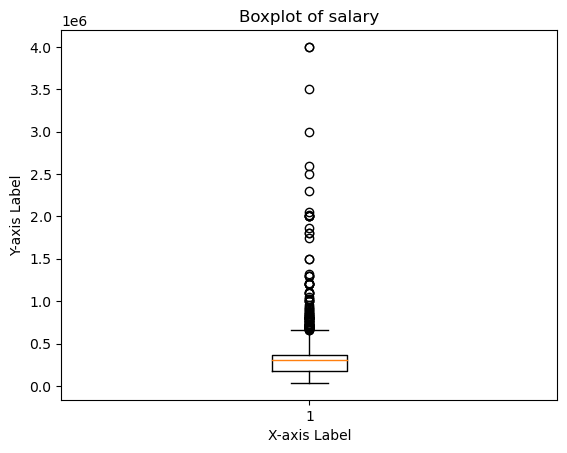

In [36]:
boxplot(df,'salary')

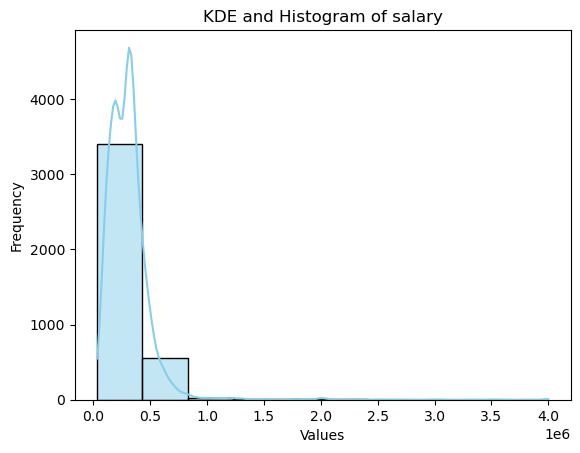

In [37]:
hist_kde(df,'salary')

### Insights :
    From the above diagrams it is noted that the minimum salary is around 35,000 lakhs to a maximum of 40,00,000 lakhs and through the box plot it reveals the presence of outliers in the datset and therefor there is an uneven distribtion of data and the presence of outliers is depicted in the kde_histogram chart


In [38]:
## detecting outliesrs
# IQR
def outliers(data,col):
    q1 = data[col].quantile(0.25)
    q3 = data[col].quantile(0.75)
    iqr = q3-q1
    lower_limit = max(data[col].min(),q1-1.5*iqr)
    upper_limit = min(data[col].max(),q3+1.5*iqr)
    print('*'*10,f'Outliers for {col}','*'*10)
    print()
    print('lower_limit: ',lower_limit)
    print('Q1 :',q1)
    print('Q3 :',q3)
    print('upper_limit: ',upper_limit)
    print('count of lower outliers :',data[data[col] < lower_limit][col].count())
    print('count of upper outliers :',data[data[col] > upper_limit][col].count())
    print('*'*10,f'Outliers for {col}','*'*10)

    return data[(data[col] >=lower_limit) & (data[col] <= upper_limit)]


In [39]:
#checking the outliers in the column of salary
salary = outliers(df,'salary')

********** Outliers for salary **********

lower_limit:  35000
Q1 : 180000.0
Q3 : 370000.0
upper_limit:  655000.0
count of lower outliers : 0
count of upper outliers : 109
********** Outliers for salary **********


In [40]:
salary['salary'].describe()

count      3889.000000
mean     285447.158653
std      126514.542129
min       35000.000000
25%      180000.000000
50%      300000.000000
75%      360000.000000
max      655000.000000
Name: salary, dtype: float64

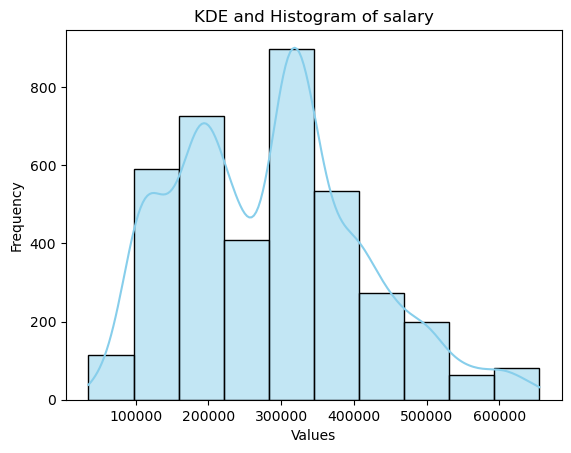

In [41]:
hist_kde(salary,'salary')

### Insights:
    from the above graph its seen that there most peoples salaries are in the range 3,00,000 lakhs to 3,50,000 

In [42]:
numerical_cols

['salary',
 '12graduation',
 '12percentage',
 'collegegpa',
 'graduationyear',
 'english',
 'logical',
 'quant',
 'domain',
 'computerprogramming',
 'electronicsandsemicon',
 'computerscience',
 'mechanicalengg',
 'electricalengg',
 'telecomengg',
 'civilengg',
 'conscientiousness',
 'agreeableness',
 'extraversion',
 'nueroticism',
 'openess_to_experience']

In [43]:
df[df.salary==4000000]

,salary,doj,dol,designation,jobcity,gender,dob,12graduation,12percentage,degree,specialization,collegegpa,collegestate,graduationyear,english,logical,quant,domain,computerprogramming,electronicsandsemicon,computerscience,mechanicalengg,electricalengg,telecomengg,civilengg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
1237,4000000,2010-07-01,2015-03-01 00:00:00,senior software engineer,New Delhi,m,1987-09-09,2005,88.77,B.Tech/B.E.,computer engineering,72.6,Rajasthan,2010,675,685,585,0.990009,655,-1,-1,-1,-1,-1,-1,-0.7264,0.0328,-1.6502,-0.8778,-0.1295
2182,4000000,2010-01-01,2011-12-01 00:00:00,automation engineer,gurgaon,m,1987-09-13,2004,61.00,MCA,computer application,65.0,Uttar Pradesh,2010,405,455,475,0.525923,415,-1,-1,-1,-1,-1,-1,-3.3539,-0.4353,-1.0697,-0.0552,-2.6572


In [44]:
df.corr(numeric_only=True)

,salary,12graduation,12percentage,collegegpa,graduationyear,english,logical,quant,domain,computerprogramming,electronicsandsemicon,computerscience,mechanicalengg,electricalengg,telecomengg,civilengg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
salary,1.000000,-0.161383,0.170254,0.130103,-0.010053,0.178219,0.179275,0.230627,0.104656,0.115665,0.000665,-0.100720,0.018475,-0.047598,-0.022691,0.037639,-0.064148,0.057423,-0.010213,-0.054685,-0.011312
12graduation,-0.161383,1.000000,0.259166,0.086001,0.014457,0.147925,0.105887,0.001379,-0.034163,-0.047995,-0.005891,0.293439,0.035459,0.123751,0.023470,-0.004727,0.103329,0.041182,0.061956,-0.074369,-0.015069
12percentage,0.170254,0.259166,1.000000,0.346137,-0.012933,0.212888,0.243571,0.312413,0.074099,0.080818,0.117112,-0.043534,0.037635,0.064001,0.044201,0.005910,0.058299,0.103998,-0.007486,-0.094369,0.006332
collegegpa,0.130103,0.086001,0.346137,1.000000,0.008706,0.106478,0.196610,0.217380,0.107252,0.136596,0.029855,0.007601,-0.031765,0.052258,-0.005226,-0.018950,0.069582,0.068282,-0.032684,-0.074859,0.028071
graduationyear,-0.010053,0.014457,-0.012933,0.008706,1.000000,-0.024089,-0.024018,-0.021781,-0.009741,0.026688,0.006179,0.024089,-0.066844,0.008525,0.004226,0.001696,-0.013235,-0.002877,0.008397,-0.000417,0.016855
english,0.178219,0.147925,0.212888,0.106478,-0.024089,1.000000,0.444357,0.375784,0.089721,0.125005,0.018591,0.059500,-0.002477,0.032438,-0.005822,-0.007724,0.034943,0.194990,0.018755,-0.155528,0.067979
logical,0.179275,0.105887,0.243571,0.196610,-0.024018,0.444357,1.000000,0.500152,0.169453,0.183905,-0.009994,0.044481,-0.009861,0.012003,-0.012947,-0.011286,0.025876,0.167207,-0.006949,-0.178781,0.048420
quant,0.230627,0.001379,0.312413,0.217380,-0.021781,0.375784,0.500152,1.000000,0.207108,0.146035,0.104221,-0.043379,0.019933,0.020975,0.021387,0.000528,-0.005639,0.103443,-0.028616,-0.131895,0.020377
domain,0.104656,-0.034163,0.074099,0.107252,-0.009741,0.089721,0.169453,0.207108,1.000000,0.306160,0.090587,0.058762,0.048472,0.042875,0.024442,0.017569,-0.039478,0.051944,-0.024647,-0.017928,0.010412
computerprogramming,0.115665,-0.047995,0.080818,0.136596,0.026688,0.125005,0.183905,0.146035,0.306160,1.000000,-0.369560,0.253039,-0.284891,-0.138224,-0.248269,-0.088249,0.012862,0.076934,0.043504,-0.084344,0.043133


In [45]:
# examining the column 12percentage of the dataset
df['12percentage'].describe()

count    3998.000000
mean       74.466366
std        10.999933
min        40.000000
25%        66.000000
50%        74.400000
75%        82.600000
max        98.700000
Name: 12percentage, dtype: float64

In [46]:
df['12percentage'].value_counts()

12percentage
70.00    72
72.00    68
74.00    63
62.00    58
68.00    58
         ..
58.50     1
74.45     1
95.41     1
83.58     1
82.55     1
Name: count, Length: 801, dtype: int64

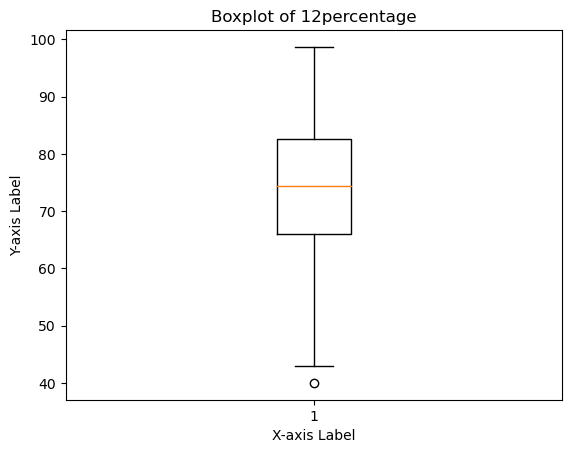

In [47]:
# checking for outliers
boxplot(df,'12percentage')

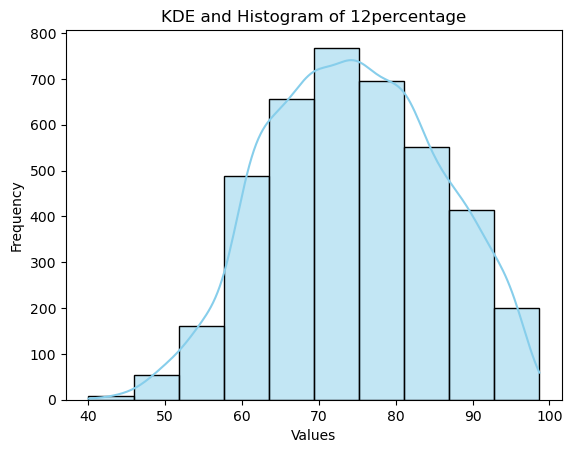

In [48]:
# plotting a histogram
hist_kde(df,'12percentage')

In [49]:
# outliers
outliers(df,'12percentage')

********** Outliers for 12percentage **********

lower_limit:  41.10000000000001
Q1 : 66.0
Q3 : 82.6
upper_limit:  98.7
count of lower outliers : 1
count of upper outliers : 0
********** Outliers for 12percentage **********


,salary,doj,dol,designation,jobcity,gender,dob,12graduation,12percentage,degree,specialization,collegegpa,collegestate,graduationyear,english,logical,quant,domain,computerprogramming,electronicsandsemicon,computerscience,mechanicalengg,electricalengg,telecomengg,civilengg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,420000,2012-06-01,present,senior quality engineer,Bangalore,f,1990-02-19,2007,95.80,B.Tech/B.E.,computer engineering,78.00,Andhra Pradesh,2011,515,585,525,0.635979,445,-1,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,500000,2013-09-01,present,assistant manager,Indore,m,1989-10-04,2007,85.00,B.Tech/B.E.,electronics and communication engineering,70.06,Madhya Pradesh,2012,695,610,780,0.960603,-1,466,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,325000,2014-06-01,present,systems engineer,Chennai,f,1992-08-03,2010,68.20,B.Tech/B.E.,information technology,70.00,Uttar Pradesh,2014,615,545,370,0.450877,395,-1,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,1100000,2011-07-01,present,senior software engineer,Gurgaon,m,1989-12-05,2007,83.60,B.Tech/B.E.,computer engineering,74.64,Delhi,2011,635,585,625,0.974396,615,-1,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,200000,2014-03-01,2015-03-01 00:00:00,get,Manesar,m,1991-02-27,2008,76.80,B.Tech/B.E.,electronics and communication engineering,73.90,Uttar Pradesh,2012,545,625,465,0.124502,-1,233,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3993,280000,2011-10-01,2012-10-01 00:00:00,software engineer,New Delhi,m,1987-04-15,2006,55.50,B.Tech/B.E.,information technology,61.50,Haryana,2010,365,334,475,0.276047,345,-1,-1,-1,-1,-1,-1,-0.1082,0.3448,0.2366,0.64980,-0.9194
3994,100000,2013-07-01,2013-07-01 00:00:00,technical writer,Hyderabad,f,1992-08-27,2009,93.00,B.Tech/B.E.,electronics and communication engineering,77.30,Telangana,2013,415,410,535,0.881620,325,420,-1,-1,-1,-1,-1,-0.3027,0.8784,0.9322,0.77980,-0.0943
3995,320000,2013-07-01,present,associate software engineer,Bangalore,m,1991-07-03,2008,65.50,B.Tech/B.E.,computer engineering,70.00,Orissa,2012,475,475,465,0.488348,405,-1,-1,-1,-1,-1,-1,-1.5765,-1.5273,-1.5051,-1.31840,-0.7615
3996,200000,2014-07-01,2015-01-01 00:00:00,software developer,Asifabadbanglore,f,1992-03-20,2010,69.88,B.Tech/B.E.,computer science & engineering,70.42,Karnataka,2014,450,410,320,0.744758,445,-1,438,-1,-1,-1,-1,-0.1590,0.0459,-0.4511,-0.36120,-0.0943


### Insights:
    the mean 12th percentage is around 74 percentage and most of the percentages are in the range of 60 percentage to 90 percentage as evident from the histogram plot , the highest percentage is 98.7 and the lowest is 40 percentage with a presence of one lower outlier 

In [50]:
# Investigation of collegegpa column from the dataset
df['collegegpa'].describe()

count    3998.000000
mean       71.486171
std         8.167338
min         6.450000
25%        66.407500
50%        71.720000
75%        76.327500
max        99.930000
Name: collegegpa, dtype: float64

In [51]:
# from the above the minimum college gpa is 6 and and maximum is 99 and it is not possible to have below the passing percentage

In [52]:
df[df['collegegpa'] < 40]['collegegpa']

7       8.58
138     6.63
788     6.80
1419    6.85
1439    8.07
1767    7.56
2151    6.95
2229    8.13
2293    9.30
2662    8.88
2691    8.89
3308    6.45
Name: collegegpa, dtype: float64

In [53]:
df[df['collegegpa'] < 40]

,salary,doj,dol,designation,jobcity,gender,dob,12graduation,12percentage,degree,specialization,collegegpa,collegestate,graduationyear,english,logical,quant,domain,computerprogramming,electronicsandsemicon,computerscience,mechanicalengg,electricalengg,telecomengg,civilengg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
7,400000,2014-07-01,2015-07-01 00:00:00,mechanical engineer,Bangalore,m,1992-05-27,2010,91.00,B.Tech/B.E.,mechanical engineering,8.58,Tamil Nadu,2016,545,555,590,0.829585,-1,-1,-1,469,-1,-1,-1,-0.0154,1.2114,0.0100,0.1459,1.2470
138,195000,2014-10-01,2015-01-01 00:00:00,business development managerde,coimbatore,m,1991-05-04,2011,87.58,B.Tech/B.E.,information technology,6.63,Tamil Nadu,2014,380,355,210,0.144790,285,-1,284,-1,-1,-1,-1,0.8463,0.7119,0.4711,1.1601,0.4805
788,180000,2012-05-01,2013-06-01 00:00:00,electrical project engineer,Jowai,m,1989-01-12,2007,65.50,M.Tech./M.E.,electrical and power engineering,6.80,Punjab,2015,465,475,565,-1.000000,-1,300,-1,-1,-1,-1,-1,0.5100,-0.2793,-1.0697,0.1798,-1.0774
1419,180000,2014-10-01,2015-04-01 00:00:00,java software engineer,Chennai,m,1993-06-14,2010,68.00,B.Tech/B.E.,computer science & engineering,6.85,Tamil Nadu,2014,490,310,380,0.486747,445,-1,376,-1,-1,-1,-1,1.8517,0.2124,0.6248,-1.7556,-0.4776
1439,360000,2011-08-01,present,assistant professor,AM,m,1988-12-11,2007,74.00,M.Tech./M.E.,electronics engineering,8.07,Maharashtra,2014,375,245,295,0.694479,125,366,-1,473,-1,-1,260,-2.7357,-2.3073,-0.7794,0.4148,-1.5513
1767,180000,2014-06-01,2014-08-01 00:00:00,it technician,Bhopal,m,1992-09-21,2010,76.00,B.Tech/B.E.,mechanical engineering,7.56,Madhya Pradesh,2014,380,475,605,0.755375,-1,-1,-1,446,-1,-1,-1,1.9953,-0.9531,-1.6807,-0.8682,-0.8608
2151,145000,2012-02-01,2013-04-01 00:00:00,web developer,New Delhi,m,1988-06-18,2005,63.00,B.Tech/B.E.,information technology,6.95,Uttar Pradesh,2011,465,485,565,0.635979,445,-1,-1,-1,-1,-1,-1,-1.0355,0.6568,0.9623,1.4724,0.8183
2229,240000,2015-01-01,2015-04-01 00:00:00,product development engineer,Chennai,m,1992-05-01,2010,86.00,B.Tech/B.E.,mechanical engineering,8.13,Tamil Nadu,2014,535,630,545,0.459016,-1,-1,-1,376,-1,-1,-1,0.4155,-0.6201,0.0100,-0.6147,-0.4776
2293,490000,2012-10-01,2014-12-01 00:00:00,software engineer,-1,f,1990-03-18,2008,80.33,B.Tech/B.E.,computer engineering,9.30,Karnataka,2012,535,555,595,0.974396,615,-1,-1,-1,-1,-1,-1,1.1283,1.4368,-0.7068,-1.7004,0.1864
2662,470000,2011-07-01,2015-03-01 00:00:00,systems engineer,Kolkata,m,1990-02-15,2007,75.00,B.Tech/B.E.,information technology,8.88,West Bengal,2011,445,495,625,0.901490,545,-1,-1,-1,-1,-1,-1,-0.4173,-1.6833,0.5269,-1.7004,-0.9194


The college gpa above doesnt make sense as its less than the passing percentage that is 40 therefor multiplying the it with 10 keeping in observation of the rest of the columns like 10percentage,12percentage,english,logical,quant,marks

In [54]:
# multiplying the gpa with 10 which are less than 40

df['collegegpa'] = df['collegegpa'].apply(lambda x : x*10 if x < 40 else x)

In [55]:
df

,salary,doj,dol,designation,jobcity,gender,dob,12graduation,12percentage,degree,specialization,collegegpa,collegestate,graduationyear,english,logical,quant,domain,computerprogramming,electronicsandsemicon,computerscience,mechanicalengg,electricalengg,telecomengg,civilengg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,420000,2012-06-01,present,senior quality engineer,Bangalore,f,1990-02-19,2007,95.80,B.Tech/B.E.,computer engineering,78.00,Andhra Pradesh,2011,515,585,525,0.635979,445,-1,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,500000,2013-09-01,present,assistant manager,Indore,m,1989-10-04,2007,85.00,B.Tech/B.E.,electronics and communication engineering,70.06,Madhya Pradesh,2012,695,610,780,0.960603,-1,466,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,325000,2014-06-01,present,systems engineer,Chennai,f,1992-08-03,2010,68.20,B.Tech/B.E.,information technology,70.00,Uttar Pradesh,2014,615,545,370,0.450877,395,-1,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,1100000,2011-07-01,present,senior software engineer,Gurgaon,m,1989-12-05,2007,83.60,B.Tech/B.E.,computer engineering,74.64,Delhi,2011,635,585,625,0.974396,615,-1,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,200000,2014-03-01,2015-03-01 00:00:00,get,Manesar,m,1991-02-27,2008,76.80,B.Tech/B.E.,electronics and communication engineering,73.90,Uttar Pradesh,2012,545,625,465,0.124502,-1,233,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3993,280000,2011-10-01,2012-10-01 00:00:00,software engineer,New Delhi,m,1987-04-15,2006,55.50,B.Tech/B.E.,information technology,61.50,Haryana,2010,365,334,475,0.276047,345,-1,-1,-1,-1,-1,-1,-0.1082,0.3448,0.2366,0.64980,-0.9194
3994,100000,2013-07-01,2013-07-01 00:00:00,technical writer,Hyderabad,f,1992-08-27,2009,93.00,B.Tech/B.E.,electronics and communication engineering,77.30,Telangana,2013,415,410,535,0.881620,325,420,-1,-1,-1,-1,-1,-0.3027,0.8784,0.9322,0.77980,-0.0943
3995,320000,2013-07-01,present,associate software engineer,Bangalore,m,1991-07-03,2008,65.50,B.Tech/B.E.,computer engineering,70.00,Orissa,2012,475,475,465,0.488348,405,-1,-1,-1,-1,-1,-1,-1.5765,-1.5273,-1.5051,-1.31840,-0.7615
3996,200000,2014-07-01,2015-01-01 00:00:00,software developer,Asifabadbanglore,f,1992-03-20,2010,69.88,B.Tech/B.E.,computer science & engineering,70.42,Karnataka,2014,450,410,320,0.744758,445,-1,438,-1,-1,-1,-1,-0.1590,0.0459,-0.4511,-0.36120,-0.0943


In [56]:
df['collegegpa'].describe()

count    3998.000000
mean       71.695728
std         7.406631
min        49.070000
25%        66.505000
50%        71.800000
75%        76.400000
max        99.930000
Name: collegegpa, dtype: float64

In [57]:
df['collegegpa'].value_counts()

collegegpa
70.00    112
72.00     99
75.00     83
65.00     79
68.00     76
        ... 
71.68      1
73.15      1
90.01      1
71.36      1
70.42      1
Name: count, Length: 1272, dtype: int64

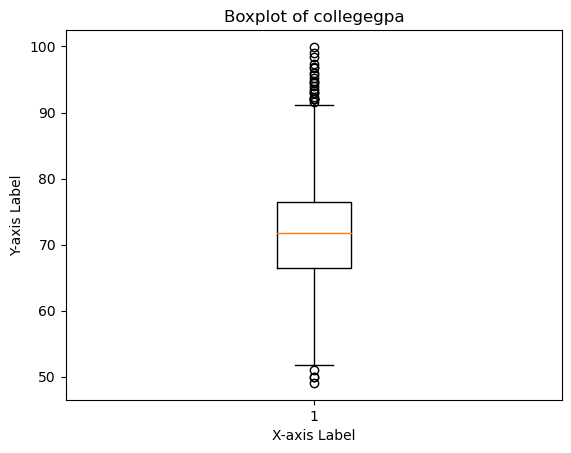

In [58]:
# boxplot of collegegpa

boxplot(df,'collegegpa')

# there are outliers present

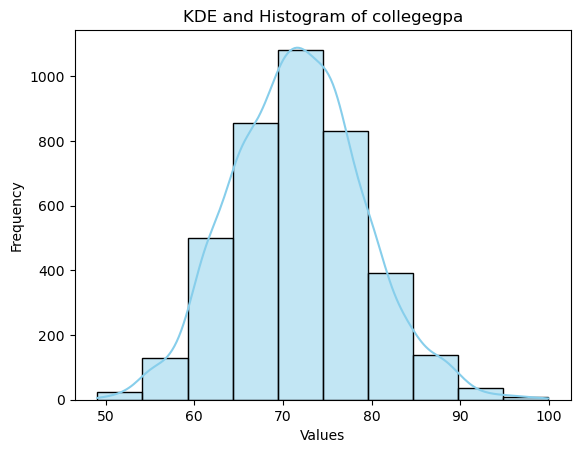

In [59]:
# ploting a histogram and kde plot of collegegpa column
hist_kde(df,'collegegpa')

In [60]:
# checking for outliers

college = outliers(df,'collegegpa')

********** Outliers for collegegpa **********

lower_limit:  51.66249999999998
Q1 : 66.505
Q3 : 76.4
upper_limit:  91.24250000000002
count of lower outliers : 4
count of upper outliers : 23
********** Outliers for collegegpa **********


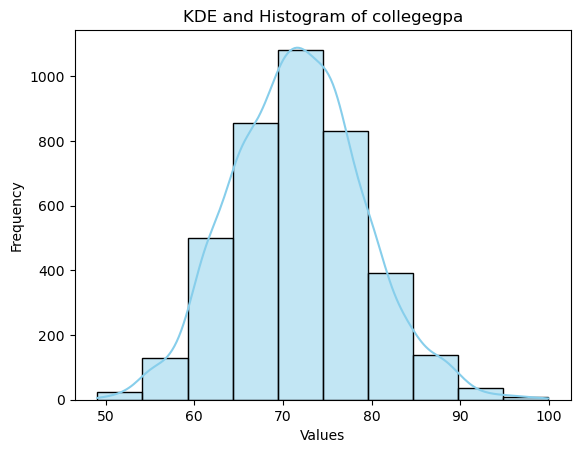

In [61]:
# applying hist_kde without outliers on the collegegpa coloumn

hist_kde(df,'collegegpa')


### Insights:
    The highest and lowest college gpa lies in the range 99 to 49 percentage and the mean percentage is 71 percentage and from the above histogram most of the data lies between 60 to 80 percentages 

In [62]:
# investigation of the column graduationyear

df['graduationyear'].describe()

# the minimum and the maximum year of graduation doesnt make any sense as the minimum year cannot be zero
# and maximum cannot be greater than 2015 as this dataset was published and released in the year 2015
# considering with the objective of the dataset the year of graduation has no affect on the salary therefor the column can be droped

count    3998.000000
mean     2012.105803
std        31.857271
min         0.000000
25%      2012.000000
50%      2013.000000
75%      2014.000000
max      2017.000000
Name: graduationyear, dtype: float64

In [63]:
df

,salary,doj,dol,designation,jobcity,gender,dob,12graduation,12percentage,degree,specialization,collegegpa,collegestate,graduationyear,english,logical,quant,domain,computerprogramming,electronicsandsemicon,computerscience,mechanicalengg,electricalengg,telecomengg,civilengg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,420000,2012-06-01,present,senior quality engineer,Bangalore,f,1990-02-19,2007,95.80,B.Tech/B.E.,computer engineering,78.00,Andhra Pradesh,2011,515,585,525,0.635979,445,-1,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,500000,2013-09-01,present,assistant manager,Indore,m,1989-10-04,2007,85.00,B.Tech/B.E.,electronics and communication engineering,70.06,Madhya Pradesh,2012,695,610,780,0.960603,-1,466,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,325000,2014-06-01,present,systems engineer,Chennai,f,1992-08-03,2010,68.20,B.Tech/B.E.,information technology,70.00,Uttar Pradesh,2014,615,545,370,0.450877,395,-1,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,1100000,2011-07-01,present,senior software engineer,Gurgaon,m,1989-12-05,2007,83.60,B.Tech/B.E.,computer engineering,74.64,Delhi,2011,635,585,625,0.974396,615,-1,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,200000,2014-03-01,2015-03-01 00:00:00,get,Manesar,m,1991-02-27,2008,76.80,B.Tech/B.E.,electronics and communication engineering,73.90,Uttar Pradesh,2012,545,625,465,0.124502,-1,233,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3993,280000,2011-10-01,2012-10-01 00:00:00,software engineer,New Delhi,m,1987-04-15,2006,55.50,B.Tech/B.E.,information technology,61.50,Haryana,2010,365,334,475,0.276047,345,-1,-1,-1,-1,-1,-1,-0.1082,0.3448,0.2366,0.64980,-0.9194
3994,100000,2013-07-01,2013-07-01 00:00:00,technical writer,Hyderabad,f,1992-08-27,2009,93.00,B.Tech/B.E.,electronics and communication engineering,77.30,Telangana,2013,415,410,535,0.881620,325,420,-1,-1,-1,-1,-1,-0.3027,0.8784,0.9322,0.77980,-0.0943
3995,320000,2013-07-01,present,associate software engineer,Bangalore,m,1991-07-03,2008,65.50,B.Tech/B.E.,computer engineering,70.00,Orissa,2012,475,475,465,0.488348,405,-1,-1,-1,-1,-1,-1,-1.5765,-1.5273,-1.5051,-1.31840,-0.7615
3996,200000,2014-07-01,2015-01-01 00:00:00,software developer,Asifabadbanglore,f,1992-03-20,2010,69.88,B.Tech/B.E.,computer science & engineering,70.42,Karnataka,2014,450,410,320,0.744758,445,-1,438,-1,-1,-1,-1,-0.1590,0.0459,-0.4511,-0.36120,-0.0943


In [64]:
numerical_cols.remove('graduationyear')

In [65]:
numerical_cols

['salary',
 '12graduation',
 '12percentage',
 'collegegpa',
 'english',
 'logical',
 'quant',
 'domain',
 'computerprogramming',
 'electronicsandsemicon',
 'computerscience',
 'mechanicalengg',
 'electricalengg',
 'telecomengg',
 'civilengg',
 'conscientiousness',
 'agreeableness',
 'extraversion',
 'nueroticism',
 'openess_to_experience']

In [66]:
# Investigating the column english amcat exam 

df['english'].describe()

count    3998.000000
mean      501.649075
std       104.940021
min       180.000000
25%       425.000000
50%       500.000000
75%       570.000000
max       875.000000
Name: english, dtype: float64

In [67]:
df['english'].value_counts()

english
475    160
545    151
465    150
535    138
405    111
      ... 
180      1
875      1
825      1
870      1
334      1
Name: count, Length: 111, dtype: int64

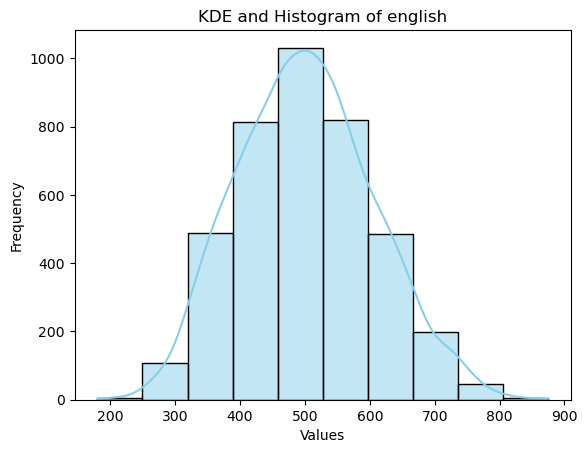

In [68]:
# ploting a histogram

hist_kde(df,'english')

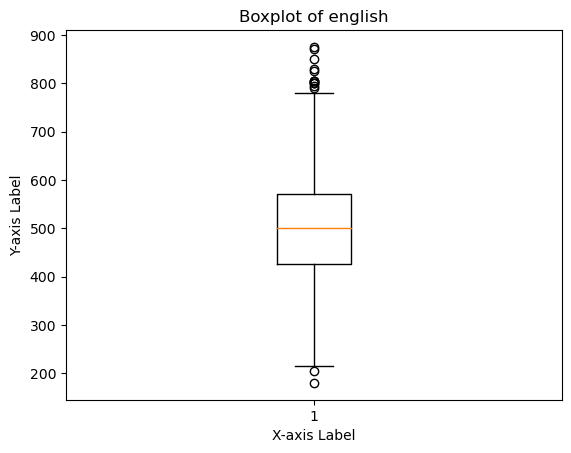

********** Outliers for english **********

lower_limit:  207.5
Q1 : 425.0
Q3 : 570.0
upper_limit:  787.5
count of lower outliers : 2
count of upper outliers : 13
********** Outliers for english **********


,salary,doj,dol,designation,jobcity,gender,dob,12graduation,12percentage,degree,specialization,collegegpa,collegestate,graduationyear,english,logical,quant,domain,computerprogramming,electronicsandsemicon,computerscience,mechanicalengg,electricalengg,telecomengg,civilengg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,420000,2012-06-01,present,senior quality engineer,Bangalore,f,1990-02-19,2007,95.80,B.Tech/B.E.,computer engineering,78.00,Andhra Pradesh,2011,515,585,525,0.635979,445,-1,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,500000,2013-09-01,present,assistant manager,Indore,m,1989-10-04,2007,85.00,B.Tech/B.E.,electronics and communication engineering,70.06,Madhya Pradesh,2012,695,610,780,0.960603,-1,466,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,325000,2014-06-01,present,systems engineer,Chennai,f,1992-08-03,2010,68.20,B.Tech/B.E.,information technology,70.00,Uttar Pradesh,2014,615,545,370,0.450877,395,-1,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,1100000,2011-07-01,present,senior software engineer,Gurgaon,m,1989-12-05,2007,83.60,B.Tech/B.E.,computer engineering,74.64,Delhi,2011,635,585,625,0.974396,615,-1,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,200000,2014-03-01,2015-03-01 00:00:00,get,Manesar,m,1991-02-27,2008,76.80,B.Tech/B.E.,electronics and communication engineering,73.90,Uttar Pradesh,2012,545,625,465,0.124502,-1,233,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3993,280000,2011-10-01,2012-10-01 00:00:00,software engineer,New Delhi,m,1987-04-15,2006,55.50,B.Tech/B.E.,information technology,61.50,Haryana,2010,365,334,475,0.276047,345,-1,-1,-1,-1,-1,-1,-0.1082,0.3448,0.2366,0.64980,-0.9194
3994,100000,2013-07-01,2013-07-01 00:00:00,technical writer,Hyderabad,f,1992-08-27,2009,93.00,B.Tech/B.E.,electronics and communication engineering,77.30,Telangana,2013,415,410,535,0.881620,325,420,-1,-1,-1,-1,-1,-0.3027,0.8784,0.9322,0.77980,-0.0943
3995,320000,2013-07-01,present,associate software engineer,Bangalore,m,1991-07-03,2008,65.50,B.Tech/B.E.,computer engineering,70.00,Orissa,2012,475,475,465,0.488348,405,-1,-1,-1,-1,-1,-1,-1.5765,-1.5273,-1.5051,-1.31840,-0.7615
3996,200000,2014-07-01,2015-01-01 00:00:00,software developer,Asifabadbanglore,f,1992-03-20,2010,69.88,B.Tech/B.E.,computer science & engineering,70.42,Karnataka,2014,450,410,320,0.744758,445,-1,438,-1,-1,-1,-1,-0.1590,0.0459,-0.4511,-0.36120,-0.0943


In [69]:
# plottin a box plot

boxplot(df,'english')

# checking for outliers

outliers(df,'english')

# Insights:
    In the AMCAT English paper the minimum and maximum scores scored are 180 to 875 with a mean of 500 marks and most of the 
    scores are scored between the range 350 to 650 as per the histogram plot and there are 13 outliers from the upper limit meaning 13 students have scored really good

In [70]:
# Investigation of logical column

df['logical'].describe()

count    3998.000000
mean      501.598799
std        86.783297
min       195.000000
25%       445.000000
50%       505.000000
75%       565.000000
max       795.000000
Name: logical, dtype: float64

In [71]:
df['logical'].value_counts()

logical
495    158
545    151
555    151
485    151
505    117
      ... 
310      1
795      1
534      1
454      1
660      1
Name: count, Length: 107, dtype: int64

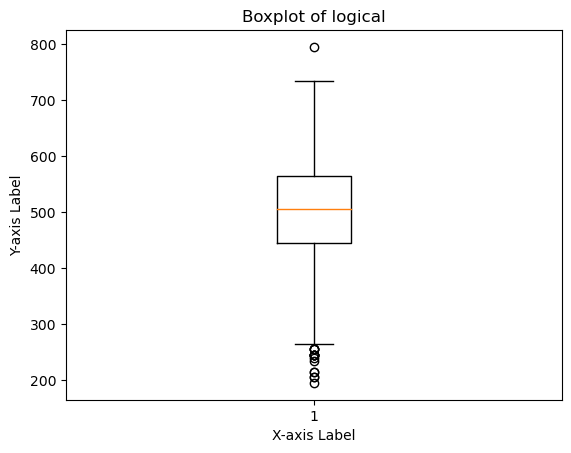

In [72]:
# boxplot of logical column

boxplot(df,'logical')

# there are presence of outliers in the dataset

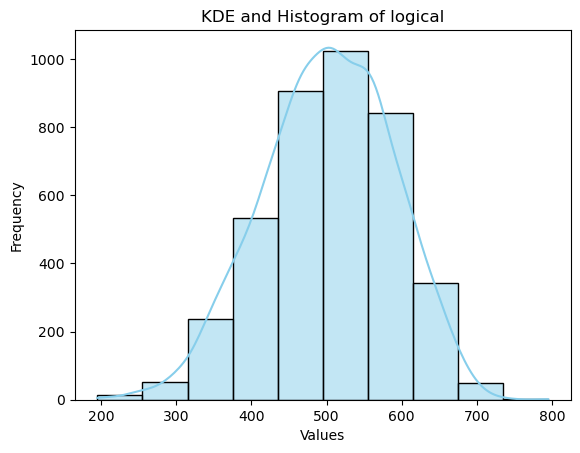

In [73]:
# histogram of logical column

hist_kde(df,'logical')

In [74]:
# checking for outliers in logical column

logical = outliers(df,'logical')

********** Outliers for logical **********

lower_limit:  265.0
Q1 : 445.0
Q3 : 565.0
upper_limit:  745.0
count of lower outliers : 17
count of upper outliers : 1
********** Outliers for logical **********


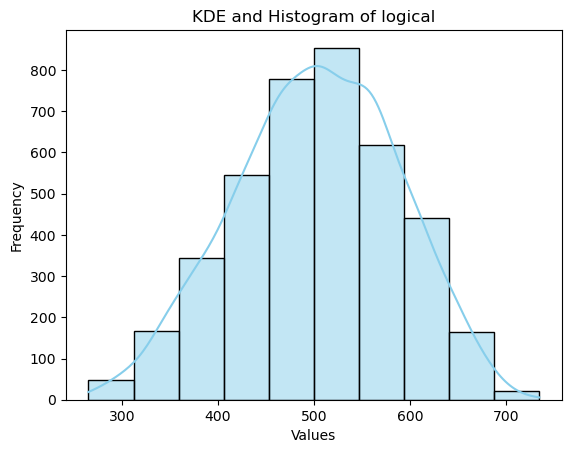

In [75]:
hist_kde(logical,'logical')

# Insights:
    The mean of AMCAT logical test is around 501 and most of the people have scored in the range 400 to 650 as evident from the hist plot

In [76]:
# Investigation of quant column

df['quant'].describe()

count    3998.000000
mean      513.378189
std       122.302332
min       120.000000
25%       430.000000
50%       515.000000
75%       595.000000
max       900.000000
Name: quant, dtype: float64

In [77]:
df['quant'].value_counts()

quant
605    143
485    130
545    125
575    116
515     99
      ... 
805      1
175      1
214      1
860      1
394      1
Name: count, Length: 138, dtype: int64

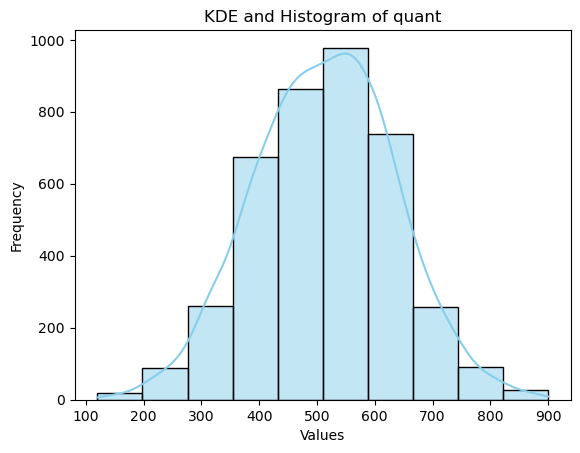

In [78]:
# plotting a histogram
hist_kde(df,'quant')

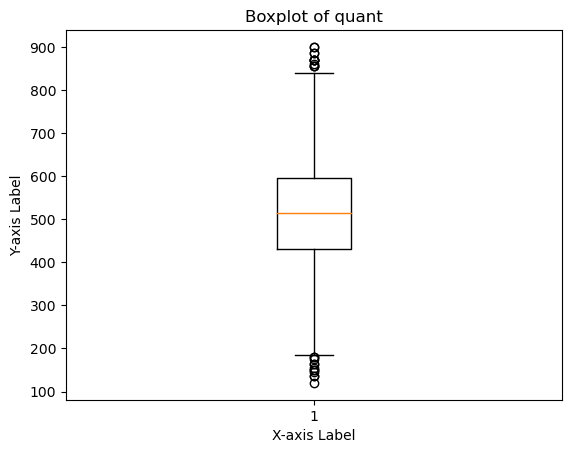

In [79]:
# plotting a boxplot

boxplot(df,'quant')

# there are outliers present

In [80]:
# outliers for quant column

quant = outliers(df,'quant')

********** Outliers for quant **********

lower_limit:  182.5
Q1 : 430.0
Q3 : 595.0
upper_limit:  842.5
count of lower outliers : 12
count of upper outliers : 13
********** Outliers for quant **********


### Insights:
    The minimum and max marks scored in quant up till 2015 is 120 to 900 respectively with a mean score of 513 and most of the students have scored between the range of 400 to 680 marks as evident from the histogram

In [81]:
numerical_cols

['salary',
 '12graduation',
 '12percentage',
 'collegegpa',
 'english',
 'logical',
 'quant',
 'domain',
 'computerprogramming',
 'electronicsandsemicon',
 'computerscience',
 'mechanicalengg',
 'electricalengg',
 'telecomengg',
 'civilengg',
 'conscientiousness',
 'agreeableness',
 'extraversion',
 'nueroticism',
 'openess_to_experience']

In [82]:
# Investigation of computerprogramming column

df['computerprogramming'].describe()

# as seen below the minimum -1 does not make sense as it represents absentism therefor substituting -1 with nan
# so that it doesnt affect the mean

count    3998.000000
mean      353.102801
std       205.355519
min        -1.000000
25%       295.000000
50%       415.000000
75%       495.000000
max       840.000000
Name: computerprogramming, dtype: float64

In [83]:
df['computerprogramming'] = df['computerprogramming'].apply(lambda x: np.NaN if x==-1 else x)

In [84]:
df['computerprogramming'].describe()

count    3130.000000
mean      451.301278
std        97.158687
min       105.000000
25%       385.000000
50%       455.000000
75%       515.000000
max       840.000000
Name: computerprogramming, dtype: float64

In [85]:
df['computerprogramming'].value_counts()

computerprogramming
445.0    151
435.0    144
475.0    139
465.0    134
455.0    131
        ... 
840.0      1
394.0      1
804.0      1
494.0      1
554.0      1
Name: count, Length: 78, dtype: int64

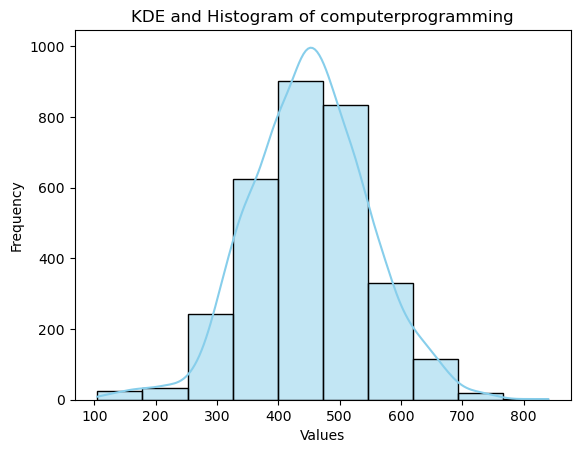

In [86]:
# plotting histogram
hist_kde(df,'computerprogramming')

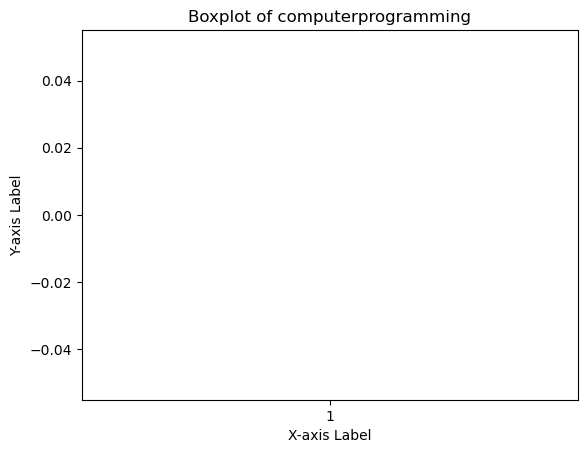

In [87]:
# plotting boxplot
boxplot(df,'computerprogramming')

In [88]:
# checking for outliers
computer_programming = outliers(df,'computerprogramming')

********** Outliers for computerprogramming **********

lower_limit:  190.0
Q1 : 385.0
Q3 : 515.0
upper_limit:  710.0
count of lower outliers : 28
count of upper outliers : 17
********** Outliers for computerprogramming **********


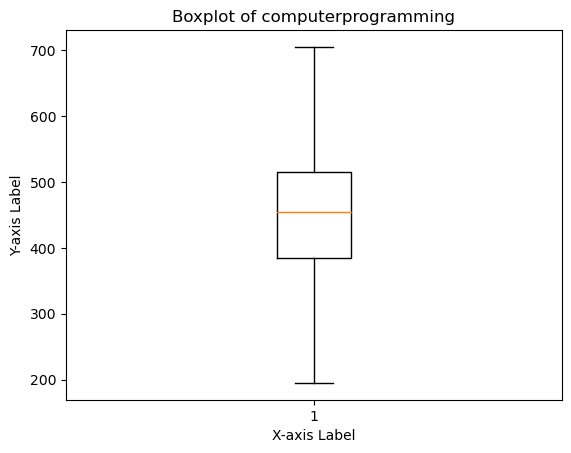

In [89]:
boxplot(computer_programming,'computerprogramming')

In [90]:
# Investigation of computerprogramming column

df['mechanicalengg'].describe()

# as seen below the minimum -1 does not make sense as it represents absentism therefor substituting -1 with nan
# so that it doesnt affect the mean

count    3998.000000
mean       22.974737
std        98.123311
min        -1.000000
25%        -1.000000
50%        -1.000000
75%        -1.000000
max       623.000000
Name: mechanicalengg, dtype: float64

In [91]:
# checking the percentage of unique values

df['mechanicalengg'].value_counts(normalize=True)

# as seen nearly 94 percentage of the data entries in this column are -1 meaning absentism and affecting the statistical value

mechanicalengg
-1      0.941221
 366    0.005003
 446    0.004002
 438    0.003752
 420    0.003502
 376    0.003252
 313    0.003252
 393    0.003252
 407    0.003002
 346    0.002751
 469    0.002501
 473    0.002501
 553    0.002001
 435    0.001751
 383    0.001501
 340    0.001501
 526    0.001251
 409    0.001251
 286    0.001251
 500    0.001001
 253    0.001001
 284    0.000750
 332    0.000750
 538    0.000750
 254    0.000750
 580    0.000750
 616    0.000500
 564    0.000500
 606    0.000500
 223    0.000500
 512    0.000500
 561    0.000500
 260    0.000500
 358    0.000250
 280    0.000250
 315    0.000250
 233    0.000250
 306    0.000250
 461    0.000250
 180    0.000250
 206    0.000250
 623    0.000250
Name: proportion, dtype: float64

In [92]:
# changing -1 to nan value in mechanicalengg column
df['mechanicalengg'] = df['mechanicalengg'].apply(lambda x: np.NaN if x==-1 else x)

In [93]:
df['mechanicalengg'].describe()

count    235.000000
mean     406.876596
std       84.894993
min      180.000000
25%      362.000000
50%      407.000000
75%      446.000000
max      623.000000
Name: mechanicalengg, dtype: float64

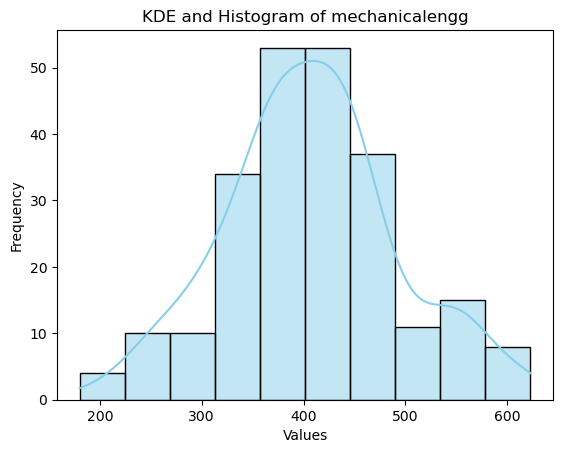

In [94]:
# plotting histogram for mechanicalengg
hist_kde(df,'mechanicalengg')

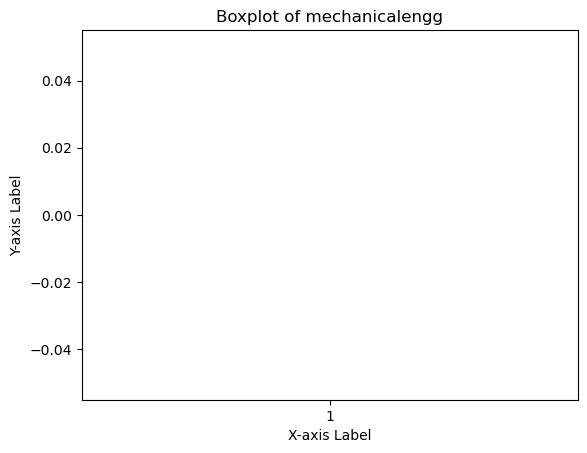

In [95]:
# boxplot for mechanicalengg
boxplot(df,'mechanicalengg')

In [96]:
# outliers in mechanicalengg column
mech = outliers(df,'mechanicalengg')

********** Outliers for mechanicalengg **********

lower_limit:  236.0
Q1 : 362.0
Q3 : 446.0
upper_limit:  572.0
count of lower outliers : 5
count of upper outliers : 8
********** Outliers for mechanicalengg **********


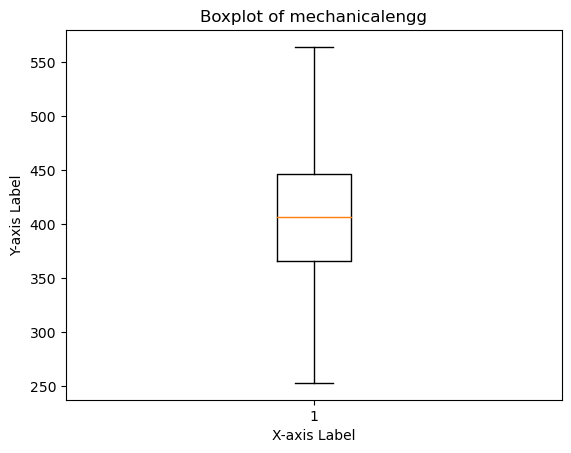

In [97]:
boxplot(mech,'mechanicalengg')

In [98]:
# Investigating electricalengg column
df['electricalengg'].describe()

# as seen below the minimum -1 does not make sense as it represents absentism therefor substituting -1 with nan
# so that it doesnt affect the mean

count    3998.000000
mean       16.478739
std        87.585634
min        -1.000000
25%        -1.000000
50%        -1.000000
75%        -1.000000
max       676.000000
Name: electricalengg, dtype: float64

In [99]:
df['electricalengg'].value_counts(normalize=True)

electricalengg
-1      0.959730
 420    0.004002
 446    0.003502
 388    0.002501
 473    0.002501
 452    0.002501
 356    0.002251
 500    0.002001
 580    0.002001
 366    0.001751
 324    0.001751
 393    0.001751
 553    0.001501
 313    0.001501
 516    0.001251
 260    0.001001
 292    0.001001
 340    0.000750
 228    0.000750
 526    0.000750
 484    0.000750
 633    0.000750
 548    0.000500
 433    0.000500
 606    0.000500
 612    0.000500
 660    0.000500
 286    0.000500
 676    0.000250
 411    0.000250
 206    0.000250
Name: proportion, dtype: float64

In [100]:
# changing -1 to nan value in electricalengg column
df['electricalengg'] = df['electricalengg'].apply(lambda x: np.NaN if x==-1 else x)

In [101]:
df['electricalengg'].describe()

count    161.000000
mean     433.037267
std       98.515537
min      206.000000
25%      366.000000
50%      433.000000
75%      500.000000
max      676.000000
Name: electricalengg, dtype: float64

In [102]:
df['electricalengg'].value_counts()

electricalengg
420.0    16
446.0    14
388.0    10
473.0    10
452.0    10
356.0     9
500.0     8
580.0     8
393.0     7
324.0     7
366.0     7
313.0     6
553.0     6
516.0     5
292.0     4
260.0     4
340.0     3
228.0     3
484.0     3
526.0     3
633.0     3
286.0     2
660.0     2
612.0     2
433.0     2
548.0     2
606.0     2
676.0     1
411.0     1
206.0     1
Name: count, dtype: int64

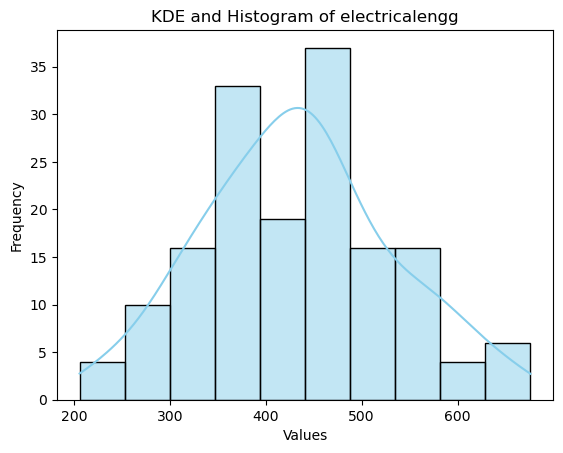

In [103]:
# histogram plot of electricalengg
hist_kde(df,'electricalengg')

In [104]:
# checking for outliers
electrical = outliers(df,'electricalengg')

********** Outliers for electricalengg **********

lower_limit:  206.0
Q1 : 366.0
Q3 : 500.0
upper_limit:  676.0
count of lower outliers : 0
count of upper outliers : 0
********** Outliers for electricalengg **********


In [105]:
numerical_cols

['salary',
 '12graduation',
 '12percentage',
 'collegegpa',
 'english',
 'logical',
 'quant',
 'domain',
 'computerprogramming',
 'electronicsandsemicon',
 'computerscience',
 'mechanicalengg',
 'electricalengg',
 'telecomengg',
 'civilengg',
 'conscientiousness',
 'agreeableness',
 'extraversion',
 'nueroticism',
 'openess_to_experience']

In [106]:
# Investigation of electronicsandsemicon column

df['electronicsandsemicon'].describe()

# as seen below the minimum -1 does not make sense as it represents absentism therefor substituting -1 with nan
# so that it doesnt affect the mean

count    3998.000000
mean       95.328414
std       158.241218
min        -1.000000
25%        -1.000000
50%        -1.000000
75%       233.000000
max       612.000000
Name: electronicsandsemicon, dtype: float64

In [107]:
# changing -1 to nan value in electricalengg column
df['electronicsandsemicon'] = df['electronicsandsemicon'].apply(lambda x: np.NaN if x==-1 else x)

In [108]:
df['electronicsandsemicon'].describe()
# nearly 1144 people took this specialization test and its mean is 335

count    1144.000000
mean      335.644231
std        81.194840
min       133.000000
25%       292.000000
50%       333.000000
75%       388.000000
max       612.000000
Name: electronicsandsemicon, dtype: float64

In [109]:
df['electronicsandsemicon'].value_counts()

electronicsandsemicon
333.0    124
300.0    114
366.0    103
266.0     88
400.0     84
292.0     74
324.0     66
356.0     66
233.0     53
388.0     47
433.0     46
200.0     43
260.0     36
466.0     31
452.0     29
228.0     24
500.0     23
420.0     22
196.0     16
166.0     12
484.0     10
516.0      9
533.0      6
548.0      5
566.0      4
133.0      4
164.0      3
612.0      2
Name: count, dtype: int64

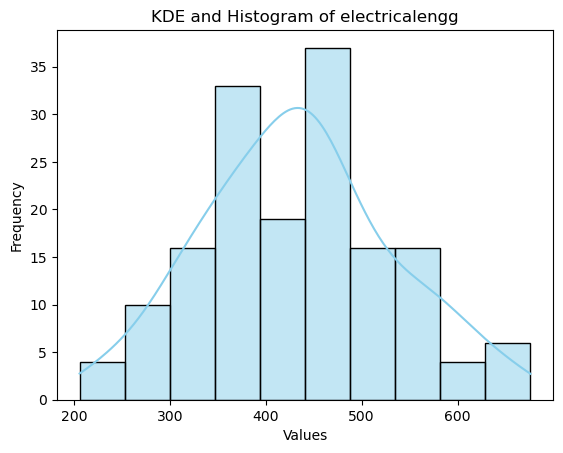

In [110]:
# histogram plot of electricalengg
hist_kde(df,'electricalengg')

In [111]:
# checking for outliers
electricalandsemicon = outliers(df,'electronicsandsemicon')

********** Outliers for electronicsandsemicon **********

lower_limit:  148.0
Q1 : 292.0
Q3 : 388.0
upper_limit:  532.0
count of lower outliers : 4
count of upper outliers : 17
********** Outliers for electronicsandsemicon **********


In [112]:
# Investigation of computerscience column

df['computerscience'].describe()

# as seen below the minimum -1 does not make sense as it represents absentism therefor substituting -1 with nan
# so that it doesnt affect the mean

count    3998.000000
mean       90.742371
std       175.273083
min        -1.000000
25%        -1.000000
50%        -1.000000
75%        -1.000000
max       715.000000
Name: computerscience, dtype: float64

In [113]:
# changing -1 to nan value in electricalengg column
df['computerscience'] = df['computerscience'].apply(lambda x: np.NaN if x==-1 else x)

In [114]:
df['computerscience'].describe()

count    902.000000
mean     405.636364
std       89.960805
min      130.000000
25%      346.000000
50%      407.000000
75%      469.000000
max      715.000000
Name: computerscience, dtype: float64

In [115]:
df['computerscience'].value_counts()

computerscience
407.0    128
376.0    123
346.0    118
438.0    111
469.0     80
315.0     77
500.0     64
284.0     50
530.0     45
253.0     30
561.0     22
223.0     14
592.0     14
623.0     10
653.0      9
192.0      3
715.0      2
684.0      1
130.0      1
Name: count, dtype: int64

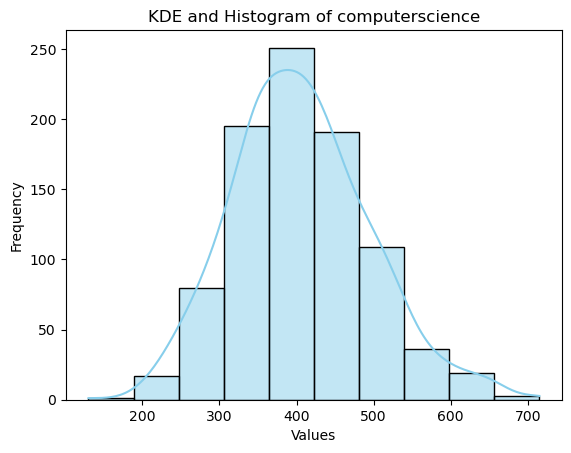

In [116]:
# histogram plot of electricalengg
hist_kde(df,'computerscience')

In [117]:
# checking for outliers
computer_science = outliers(df,'computerscience')

********** Outliers for computerscience **********

lower_limit:  161.5
Q1 : 346.0
Q3 : 469.0
upper_limit:  653.5
count of lower outliers : 1
count of upper outliers : 3
********** Outliers for computerscience **********


In [118]:
# Investigation of telecomengg column

df['telecomengg'].describe()

# as seen below the minimum -1 does not make sense as it represents absentism therefor substituting -1 with nan
# so that it doesnt affect the mean

count    3998.000000
mean       31.851176
std       104.852845
min        -1.000000
25%        -1.000000
50%        -1.000000
75%        -1.000000
max       548.000000
Name: telecomengg, dtype: float64

In [119]:
# changing -1 to nan value in electricalengg column
df['telecomengg'] = df['telecomengg'].apply(lambda x: np.NaN if x==-1 else x)

In [120]:
df['telecomengg'].describe()

count    374.000000
mean     350.173797
std       75.661864
min      153.000000
25%      287.500000
50%      356.000000
75%      393.000000
max      548.000000
Name: telecomengg, dtype: float64

In [121]:
df['telecomengg'].value_counts()

telecomengg
393.0    45
366.0    43
260.0    35
313.0    34
340.0    32
286.0    31
420.0    26
446.0    16
388.0    14
233.0    14
473.0    13
292.0    13
356.0    12
324.0    11
206.0     8
500.0     5
526.0     5
516.0     4
484.0     4
228.0     3
548.0     2
153.0     1
196.0     1
164.0     1
452.0     1
Name: count, dtype: int64

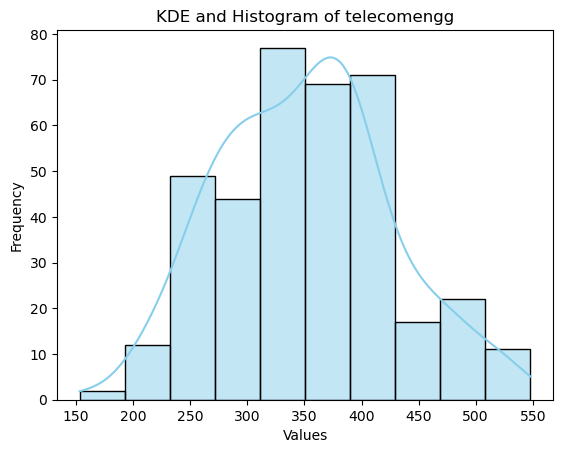

In [122]:
# histogram plot of electricalengg
hist_kde(df,'telecomengg')

In [123]:
# checking for outliers
telecom = outliers(df,'telecomengg')

********** Outliers for telecomengg **********

lower_limit:  153.0
Q1 : 287.5
Q3 : 393.0
upper_limit:  548.0
count of lower outliers : 0
count of upper outliers : 0
********** Outliers for telecomengg **********


In [124]:
# Investigation of civilengg column

df['civilengg'].describe()

# as seen below the minimum -1 does not make sense as it represents absentism therefor substituting -1 with nan
# so that it doesnt affect the mean

count    3998.000000
mean        2.683842
std        36.658505
min        -1.000000
25%        -1.000000
50%        -1.000000
75%        -1.000000
max       516.000000
Name: civilengg, dtype: float64

In [125]:
# changing -1 to nan value in electricalengg column
df['civilengg'] = df['civilengg'].apply(lambda x: np.NaN if x==-1 else x)

In [126]:
df['civilengg'].describe()

count     42.000000
mean     349.666667
std       79.784670
min      166.000000
25%      292.000000
50%      348.000000
75%      388.000000
max      516.000000
Name: civilengg, dtype: float64

In [127]:
df['civilengg'].value_counts()

civilengg
356.0    6
292.0    6
388.0    4
320.0    3
260.0    3
500.0    2
300.0    2
340.0    2
516.0    1
460.0    1
420.0    1
280.0    1
433.0    1
380.0    1
322.0    1
277.0    1
166.0    1
400.0    1
452.0    1
200.0    1
440.0    1
480.0    1
Name: count, dtype: int64

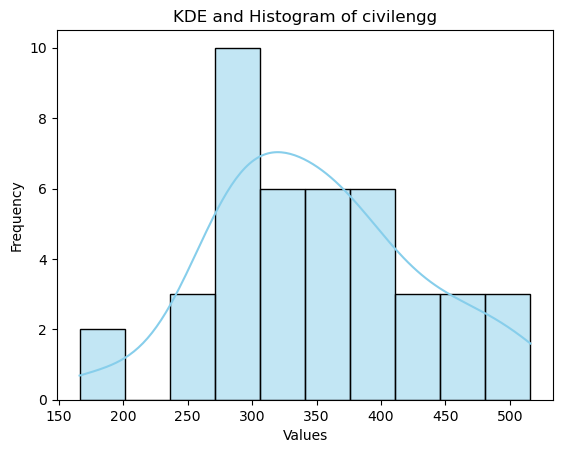

In [128]:
# histogram plot of electricalengg
hist_kde(df,'civilengg')

In [129]:
# checking for outliers
civil = outliers(df,'civilengg')

********** Outliers for civilengg **********

lower_limit:  166.0
Q1 : 292.0
Q3 : 388.0
upper_limit:  516.0
count of lower outliers : 0
count of upper outliers : 0
********** Outliers for civilengg **********


In [130]:
# Investigation of conscientiousness column

df['conscientiousness'].describe()


count    3998.000000
mean       -0.037831
std         1.028666
min        -4.126700
25%        -0.713525
50%         0.046400
75%         0.702700
max         1.995300
Name: conscientiousness, dtype: float64

In [131]:
df['conscientiousness'].value_counts()

conscientiousness
 0.2718    145
 0.1282    134
-0.1590    133
 0.4155    131
-0.0154    129
          ... 
-3.4624      1
-1.2950      1
-0.9653      1
-0.4854      1
 0.8986      1
Name: count, Length: 141, dtype: int64

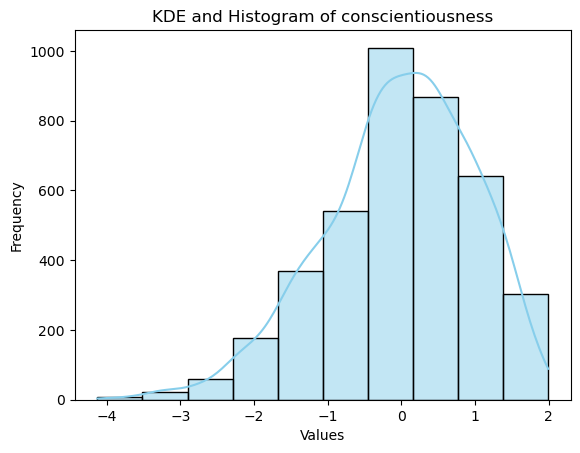

In [132]:
hist_kde(df,'conscientiousness')

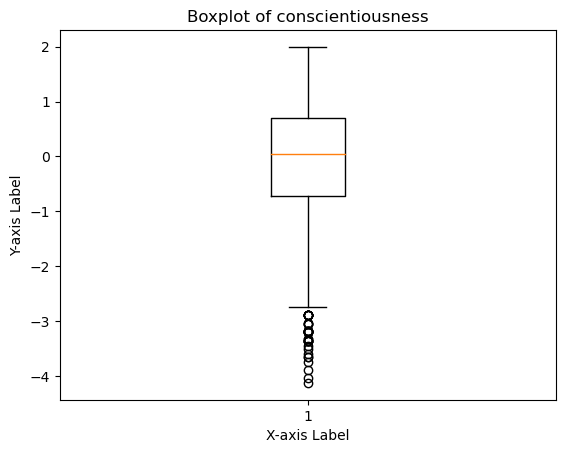

In [133]:
boxplot(df,'conscientiousness')

In [134]:
con = outliers(df,'conscientiousness')

********** Outliers for conscientiousness **********

lower_limit:  -2.8378625000000004
Q1 : -0.7135250000000001
Q3 : 0.7027
upper_limit:  1.9953
count of lower outliers : 39
count of upper outliers : 0
********** Outliers for conscientiousness **********


In [135]:
# Investigation of agreeableness column

df['agreeableness'].describe()


count    3998.000000
mean        0.146496
std         0.941782
min        -5.781600
25%        -0.287100
50%         0.212400
75%         0.812800
max         1.904800
Name: agreeableness, dtype: float64

In [136]:
df['agreeableness'].value_counts()

agreeableness
 0.3789    193
 0.2124    180
 0.5454    175
 0.0459    166
 0.8784    158
          ... 
-3.1264      1
-3.0094      1
-3.9501      1
-1.7223      1
-0.8320      1
Name: count, Length: 149, dtype: int64

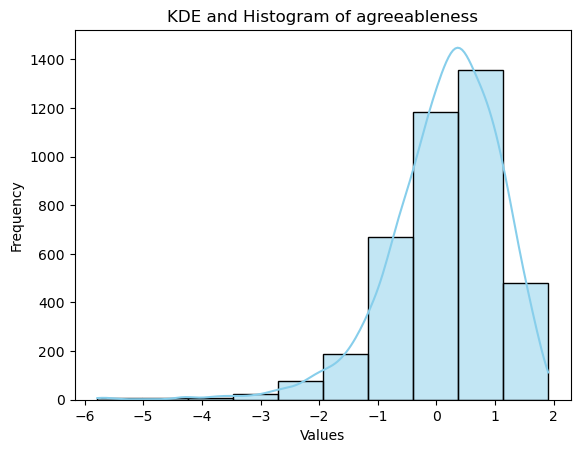

In [137]:
hist_kde(df,'agreeableness')

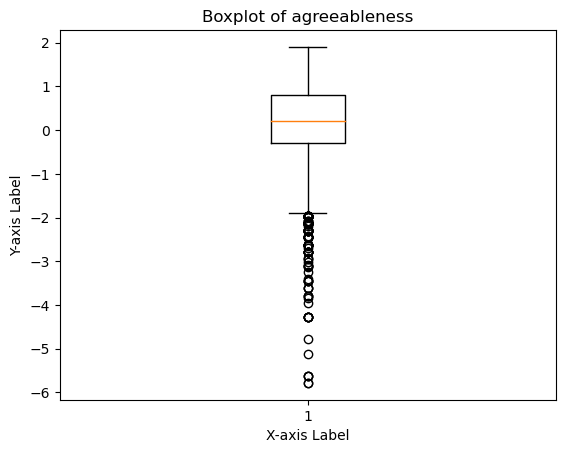

In [138]:
boxplot(df,'agreeableness')

In [139]:
agree = outliers(df,'agreeableness')

********** Outliers for agreeableness **********

lower_limit:  -1.93695
Q1 : -0.2871
Q3 : 0.8128
upper_limit:  1.9048
count of lower outliers : 123
count of upper outliers : 0
********** Outliers for agreeableness **********


In [140]:
# Investigation of extraversion column

df['extraversion'].describe()


count    3998.000000
mean        0.002763
std         0.951471
min        -4.600900
25%        -0.604800
50%         0.091400
75%         0.672000
max         2.535400
Name: extraversion, dtype: float64

In [141]:
df['extraversion'].value_counts()

extraversion
 0.4711    179
 0.3174    178
 0.1637    155
 0.7785    146
-0.1437    135
          ... 
-3.5370      1
-0.4226      1
 1.5791      1
-0.1408      1
-1.2056      1
Name: count, Length: 154, dtype: int64

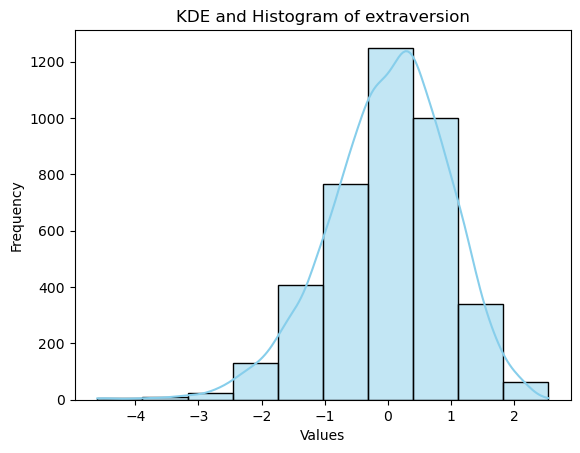

In [142]:
hist_kde(df,'extraversion')

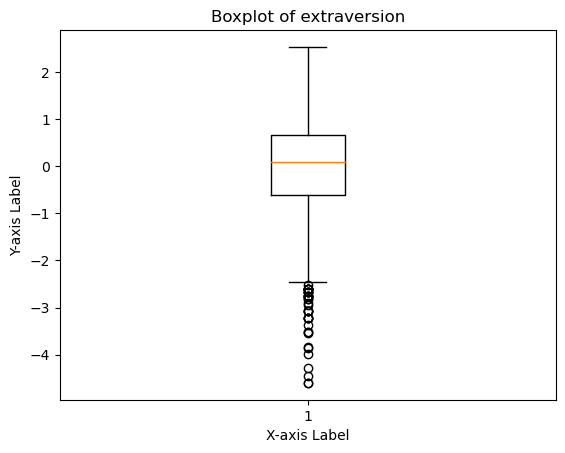

In [143]:
boxplot(df,'extraversion')

In [144]:
extrovert = outliers(df,'extraversion')

********** Outliers for extraversion **********

lower_limit:  -2.5200000000000005
Q1 : -0.6048
Q3 : 0.672
upper_limit:  2.5354
count of lower outliers : 40
count of upper outliers : 0
********** Outliers for extraversion **********


In [145]:
# Investigation of nueroticism column

df['nueroticism'].describe()


count    3998.000000
mean       -0.169033
std         1.007580
min        -2.643000
25%        -0.868200
50%        -0.234400
75%         0.526200
max         3.352500
Name: nueroticism, dtype: float64

In [146]:
df['nueroticism'].value_counts()

nueroticism
-0.48790    126
-0.74150    118
 0.01920    112
-0.61470    109
-0.36120    106
           ... 
 1.06113      1
-0.74960      1
 2.76500      1
 1.82493      1
 2.03060      1
Name: count, Length: 217, dtype: int64

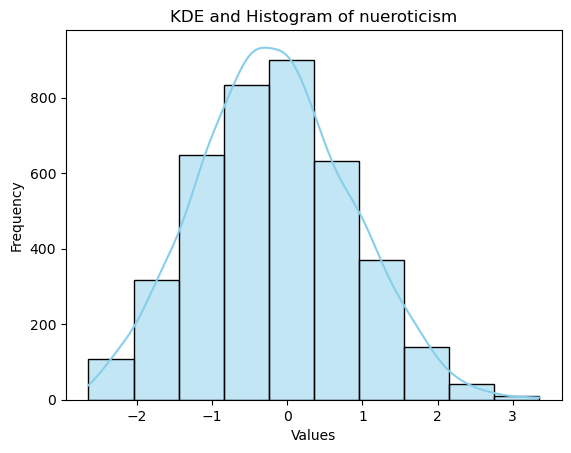

In [147]:
hist_kde(df,'nueroticism')

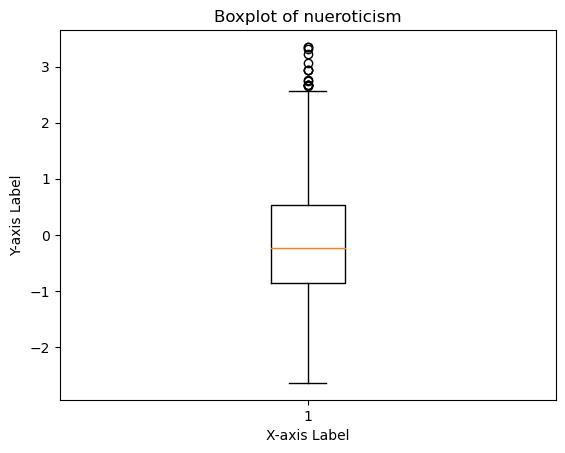

In [148]:
boxplot(df,'nueroticism')

In [149]:
net = outliers(df,'nueroticism')

********** Outliers for nueroticism **********

lower_limit:  -2.643
Q1 : -0.8682
Q3 : 0.5262
upper_limit:  2.6178
count of lower outliers : 0
count of upper outliers : 15
********** Outliers for nueroticism **********


In [150]:
# Investigation of openess_to_experience column

df['openess_to_experience'].describe()


count    3998.000000
mean       -0.138110
std         1.008075
min        -7.375700
25%        -0.669200
50%        -0.094300
75%         0.502400
max         1.822400
Name: openess_to_experience, dtype: float64

In [151]:
df['openess_to_experience'].value_counts()

openess_to_experience
 0.6721    187
-0.0943    182
 0.0973    182
 0.4805    177
 0.2889    174
          ... 
-6.8009      1
 0.1187      1
-5.6860      1
-1.1291      1
-0.4229      1
Name: count, Length: 142, dtype: int64

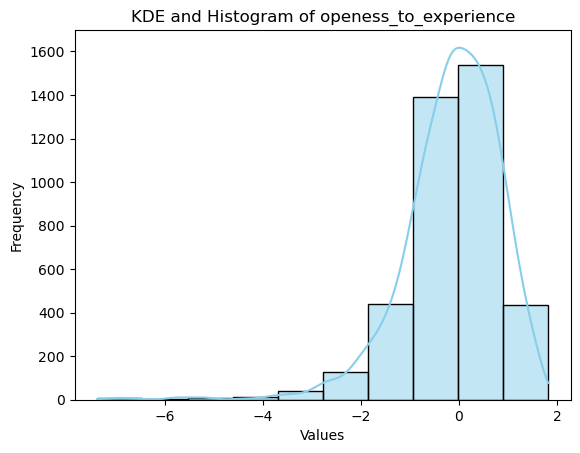

In [152]:
hist_kde(df,'openess_to_experience')

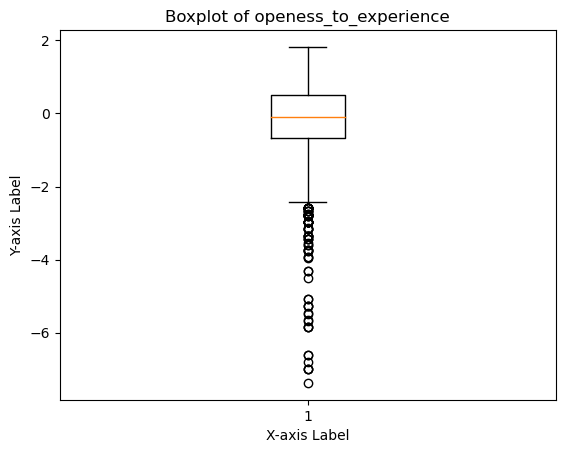

In [153]:
boxplot(df,'openess_to_experience')

In [154]:
openess = outliers(df,'openess_to_experience')

********** Outliers for openess_to_experience **********

lower_limit:  -2.4266
Q1 : -0.6692
Q3 : 0.5024
upper_limit:  1.8224
count of lower outliers : 95
count of upper outliers : 0
********** Outliers for openess_to_experience **********


In [155]:
# categorical univariate analysis

In [156]:
categorical_cols

['dol',
 'designation',
 'jobcity',
 'gender',
 'degree',
 'specialization',
 'collegestate']

In [157]:
# Investigation of dol
df['dol'].describe()

count        3998
unique         67
top       present
freq         1875
Name: dol, dtype: object

In [158]:
df['dol'] = np.where(df['dol']=='present','2016-03-01 00:00:00',df['dol'])

In [159]:
df['dol'] = pd.to_datetime(df['dol'])

In [160]:
df['dol'].value_counts()

dol
2016-03-01    1875
2015-04-01     573
2015-03-01     124
2015-05-01     112
2015-01-01      99
              ... 
2005-03-01       1
2015-10-01       1
2010-02-01       1
2011-02-01       1
2010-10-01       1
Name: count, Length: 67, dtype: int64

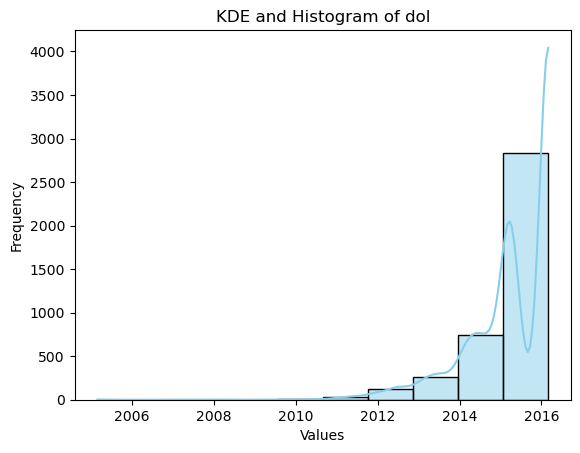

In [161]:
hist_kde(df,'dol')

# most of the people left their jobs between the year 2015 to 2016 

In [162]:
df['designation'].value_counts()[0:11]

designation
software engineer             539
software developer            265
system engineer               205
programmer analyst            139
systems engineer              118
java software engineer        111
software test engineer        100
project engineer               77
technical support engineer     76
senior software engineer       72
java developer                 67
Name: count, dtype: int64

In [163]:
df['designation'].describe()

count                  3998
unique                  419
top       software engineer
freq                    539
Name: designation, dtype: object

In [164]:
df['designation'].unique()

array(['senior quality engineer', 'assistant manager', 'systems engineer',
       'senior software engineer', 'get', 'system engineer',
       'java software engineer', 'mechanical engineer',
       'electrical engineer', 'project engineer', 'senior php developer',
       'senior systems engineer', 'quality assurance engineer',
       'qa analyst', 'network engineer', 'product development engineer',
       'associate software developer', 'data entry operator',
       'software engineer', 'developer', 'electrical project engineer',
       'programmer analyst', 'systems analyst', 'ase',
       'telecommunication engineer', 'application developer',
       'ios developer', 'executive assistant', 'online marketing manager',
       'documentation specialist', 'associate software engineer',
       'management trainee', 'site manager', 'software developer',
       '.net developer', 'production engineer', 'jr. software engineer',
       'trainee software developer', 'ui developer',
       'assi

<Axes: ylabel='designation'>

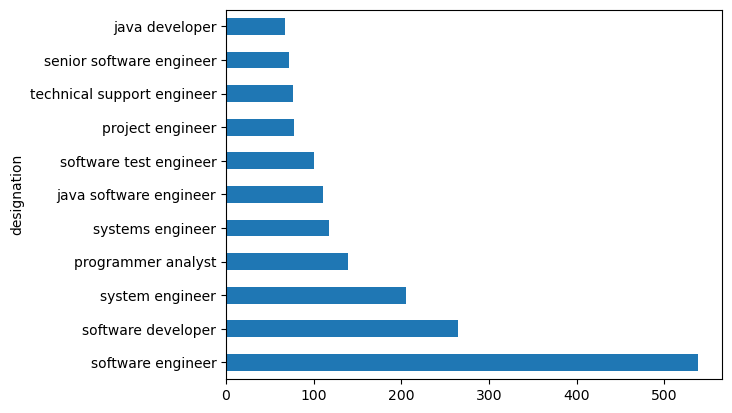

In [165]:
# plotting the top 10 counts of the designations available in the dataset

df['designation'].value_counts().sort_values(ascending=False)[0:11].plot(kind='barh')

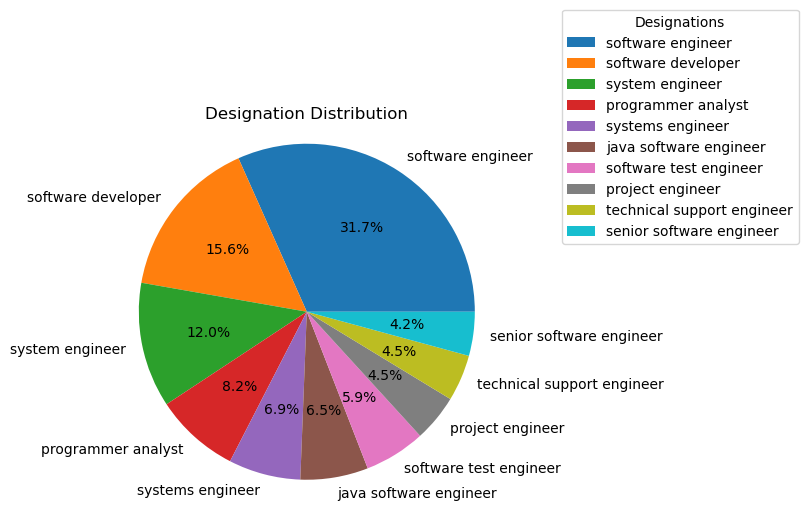

In [166]:
df['designation'].value_counts().sort_values(ascending=False)[0:10].plot(kind='pie',autopct='%.1f%%')

# Customize the plot (add title, labels, etc.)
plt.title('Designation Distribution')
plt.ylabel('')  # Remove y-axis label
plt.legend(title='Designations', bbox_to_anchor=(1, 1), loc='center left')  # Move legend to the right
plt.axis('equal')  # Set aspect ratio to be equal for a circular pie
plt.show()

In [167]:
# Investigation of jobcity

df['jobcity'].describe()

count          3998
unique          339
top       Bangalore
freq            627
Name: jobcity, dtype: object

In [168]:
df['jobcity'].value_counts()

jobcity
Bangalore           627
-1                  461
Noida               368
Hyderabad           335
Pune                290
                   ... 
Tirunelvelli          1
Ernakulam             1
Nanded                1
Dharmapuri            1
Asifabadbanglore      1
Name: count, Length: 339, dtype: int64

In [169]:
# replacing -1 with others

df['jobcity'] = df['jobcity'].apply(lambda x: 'other' if x =='-1' else str(x).lower().strip() )


In [170]:
df['jobcity'].value_counts().sort_values(ascending=False)

jobcity
bangalore               665
-1                      461
noida                   389
hyderabad               368
pune                    327
                       ... 
dammam                    1
mainpuri                  1
latur (maharashtra )      1
dausa                     1
asifabadbanglore          1
Name: count, Length: 232, dtype: int64

In [171]:
df['jobcity'].unique()

array(['bangalore', 'indore', 'chennai', 'gurgaon', 'manesar',
       'hyderabad', 'banglore', 'noida', 'kolkata', 'pune', '-1',
       'mohali', 'jhansi', 'delhi', 'bhubaneswar', 'navi mumbai',
       'mumbai', 'new delhi', 'mangalore', 'rewari', 'gaziabaad',
       'bhiwadi', 'mysore', 'rajkot', 'greater noida', 'jaipur', 'thane',
       'maharajganj', 'thiruvananthapuram', 'punchkula', 'bhubaneshwar',
       'coimbatore', 'dhanbad', 'lucknow', 'trivandrum', 'gandhi nagar',
       'una', 'daman and diu', 'gurgoan', 'vsakhapttnam', 'nagpur',
       'bhagalpur', 'new delhi - jaisalmer', 'ahmedabad', 'kochi/cochin',
       'bankura', 'bengaluru', 'kanpur', 'vijayawada', 'kochi', 'beawar',
       'alwar', 'siliguri', 'raipur', 'bhopal', 'faridabad', 'jodhpur',
       'udaipur', 'muzaffarpur', 'kolkata`', 'bulandshahar', 'haridwar',
       'raigarh', 'visakhapatnam', 'jabalpur', 'unnao', 'aurangabad',
       'belgaum', 'dehradun', 'rudrapur', 'jamshedpur', 'vizag', 'nouda',
       'dharam

In [172]:
m = ['navi mumbai,mumba','navi mumbai , hyderabad']
n = ['greater noida','noida','nouda','a-64,sec-64,noida']
g = ['gurgoan','gurgaon','gurga','guragaon']
v = ['vsakhapttnam','visakhapatnam','vizag']
d = ['new delhi - jaisalmer','delhi','ncr','delhi/ncr']
k = ['kochi/cochin','kochi','kochi/cochin','kochi/cochin, chennai and coimbatore']
u = ['unnao','una']
b = ['bengaluru','banagalore','banglore','bangalore','asifabadbanglore']
gh = ['ghaziabad','gaziabaad','indirapuram, ghaziabad','gajiabaad']
ch = ['chennai and coimbatore','chennai','kochi/cochin','chennai and coimbatore','chennai & mumbai']
tri = ['technopark, trivandrum','trivandrum']
t = ['tirupati','tirupathi']
p = ['punr','pune']
h = ['hderabad','hyderabad','hyderabad(bhadurpally)']

In [173]:
df['jobcity'] = np.where(df['jobcity'].isin(n),'noida',df['jobcity'])
df['jobcity'] = np.where(df['jobcity'].isin(g),'gurgaon',df['jobcity'])
df['jobcity'] = np.where(df['jobcity'].isin(v),'vishakapatnam',df['jobcity'])
df['jobcity'] = np.where(df['jobcity'].isin(d),'delhi',df['jobcity'])
df['jobcity'] = np.where(df['jobcity'].isin(k),'kochi',df['jobcity'])
df['jobcity'] = np.where(df['jobcity'].isin(u),'unnao',df['jobcity'])
df['jobcity'] = np.where(df['jobcity'].isin(b),'bangaluru',df['jobcity'])
df['jobcity'] = np.where(df['jobcity'].isin(gh),'ghaziabad',df['jobcity'])
df['jobcity'] = np.where(df['jobcity'].isin(ch),'chennai',df['jobcity'])
df['jobcity'] = np.where(df['jobcity'].isin(tri),'trivandrum',df['jobcity'])
df['jobcity'] = np.where(df['jobcity'].isin(t),'tirupathi',df['jobcity'])
df['jobcity'] = np.where(df['jobcity'].isin(p),'pune',df['jobcity'])
df['jobcity'] = np.where(df['jobcity'].isin(h),'hyderabad',df['jobcity'])

In [174]:
df['jobcity'].value_counts()

jobcity
bangaluru     686
-1            461
noida         420
hyderabad     370
pune          328
             ... 
dharmapuri      1
nanded          1
bankura         1
ernakulam       1
haryana         1
Name: count, Length: 205, dtype: int64

In [175]:
# Investigation of gender column

df['gender'].describe()

count     3998
unique       2
top          m
freq      3041
Name: gender, dtype: object

In [176]:
df['gender'].value_counts()

gender
m    3041
f     957
Name: count, dtype: int64

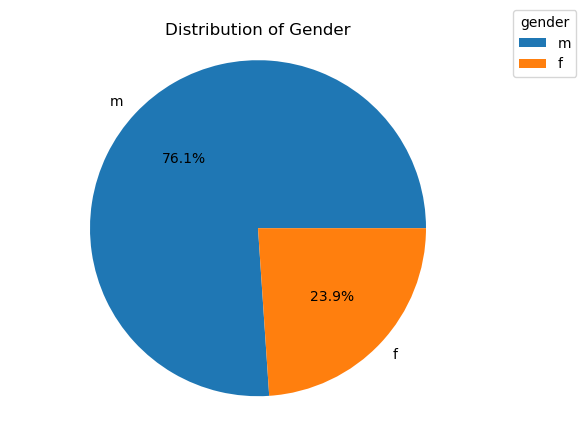

In [177]:
df['gender'].value_counts().plot(kind='pie',autopct = '%.1f%%')

# Customize the plot (add title, labels, etc.)
plt.title('Distribution of Gender')
plt.ylabel('')  # Remove y-axis label
plt.legend(title='gender', bbox_to_anchor=(1, 1), loc='center left')  # Move legend to the right
plt.axis('equal')  # Set aspect ratio to be equal for a circular pie
plt.show()

In [178]:
# Investigation of degree

df['degree'].describe()

count            3998
unique              4
top       B.Tech/B.E.
freq             3700
Name: degree, dtype: object

In [179]:
df['degree'].value_counts()

degree
B.Tech/B.E.      3700
MCA               243
M.Tech./M.E.       53
M.Sc. (Tech.)       2
Name: count, dtype: int64

<Axes: ylabel='degree'>

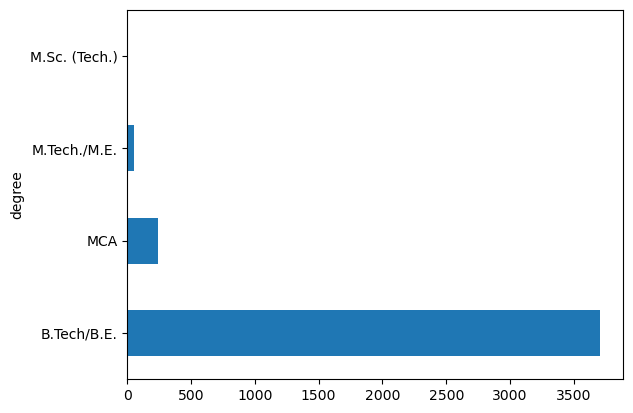

In [180]:
df['degree'].value_counts().plot(kind='barh')

In [181]:
# Investigation of specialization column

df['specialization'].describe()

count                                          3998
unique                                           46
top       electronics and communication engineering
freq                                            880
Name: specialization, dtype: object

In [182]:
df['specialization'].value_counts()

specialization
electronics and communication engineering      880
computer science & engineering                 744
information technology                         660
computer engineering                           600
computer application                           244
mechanical engineering                         201
electronics and electrical engineering         196
electronics & telecommunications               121
electrical engineering                          82
electronics & instrumentation eng               32
civil engineering                               29
electronics and instrumentation engineering     27
information science engineering                 27
instrumentation and control engineering         20
electronics engineering                         19
biotechnology                                   15
other                                           13
industrial & production engineering             10
applied electronics and instrumentation          9
chemical enginee

<Axes: xlabel='specialization'>

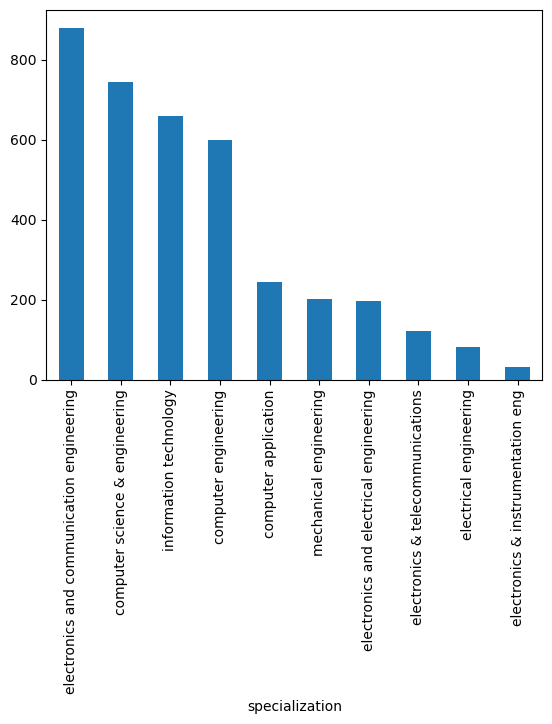

In [183]:
df['specialization'].value_counts()[0:10].plot(kind='bar')

In [184]:
# Investigation of collegestate column

df['collegestate'].describe()

count              3998
unique               26
top       Uttar Pradesh
freq                915
Name: collegestate, dtype: object

In [185]:
df['collegestate'].value_counts().reset_index()

,collegestate,count
0,Uttar Pradesh,915
1,Karnataka,370
2,Tamil Nadu,367
3,Telangana,319
4,Maharashtra,262
5,Andhra Pradesh,225
6,West Bengal,196
7,Punjab,193
8,Madhya Pradesh,189
9,Haryana,180


<Axes: ylabel='collegestate'>

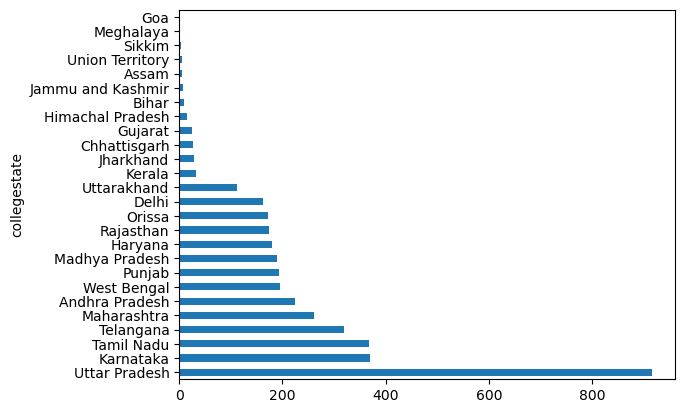

In [186]:
df['collegestate'].value_counts().plot(kind='barh')

In [187]:
import re

In [188]:
df['groups'] = df['designation'].apply(lambda x: 'programmer analyst' if str(x) in ['programmer analyst trainee', 'programmer analyst'] else str(x))

df['groups'] = df['designation'].apply(lambda x: 'software engineer' if str(x) in ['software eng','software engg','software engineer','software engineere','software enginner'] else str(x))
                                       
df['groups'] = df['designation'].apply(lambda x: 'associate engineer' if re.findall(r'associate [a-z] engineer$',str(x)) else str(x))                                    
                                       

In [189]:
 group = df['groups'].value_counts().reset_index()

In [190]:
group['groups'].unique()

array(['software engineer', 'software developer', 'system engineer',
       'programmer analyst', 'systems engineer', 'java software engineer',
       'software test engineer', 'project engineer',
       'technical support engineer', 'senior software engineer',
       'java developer', 'test engineer', 'web developer',
       'application developer', 'assistant manager', 'network engineer',
       'data analyst', 'business analyst', 'engineer',
       'android developer', 'associate software engineer', 'programmer',
       'senior systems engineer', '.net developer', 'php developer',
       'qa analyst', 'production engineer', 'design engineer',
       'asp.net developer', 'quality analyst', 'electrical engineer',
       'assistant system engineer', 'application engineer',
       'senior software developer', 'lecturer', 'system administrator',
       'management trainee', 'senior engineer',
       'customer service representative', 'customer service',
       'quality engineer', 'softwa

In [191]:
# Filter the DataFrame to include only those who graduated recently (within 1 year)
fresh_graduates = df[df['doj'].dt.year == df['graduationyear']]


In [192]:
stream=['computer engineering','computer science and technology','computer science & engineering']

In [193]:
fresh_graduates[fresh_graduates['specialization']=='electronics and communication engineering']['designation'].value_counts()

designation
software engineer           43
system engineer             29
network engineer            18
project engineer            16
software developer          15
                            ..
hr recruiter                 1
project coordinator          1
business process analyst     1
associate manager            1
technical writer             1
Name: count, Length: 152, dtype: int64

In [194]:
fresh_graduates

,salary,doj,dol,designation,jobcity,gender,dob,12graduation,12percentage,degree,specialization,collegegpa,collegestate,graduationyear,english,logical,quant,domain,computerprogramming,electronicsandsemicon,computerscience,mechanicalengg,electricalengg,telecomengg,civilengg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,groups
2,325000,2014-06-01,2016-03-01,systems engineer,chennai,f,1992-08-03,2010,68.20,B.Tech/B.E.,information technology,70.00,Uttar Pradesh,2014,615,545,370,0.450877,395.0,NaN,NaN,NaN,NaN,NaN,NaN,0.2718,1.7109,0.1637,-0.8682,0.6721,systems engineer
3,1100000,2011-07-01,2016-03-01,senior software engineer,gurgaon,m,1989-12-05,2007,83.60,B.Tech/B.E.,computer engineering,74.64,Delhi,2011,635,585,625,0.974396,615.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0464,0.3448,-0.3440,-0.4078,-0.9194,senior software engineer
5,300000,2014-06-01,2016-03-01,system engineer,hyderabad,m,1992-07-02,2010,87.00,B.Tech/B.E.,electronics and communication engineering,76.32,Karnataka,2014,560,555,620,-1.000000,645.0,NaN,407.0,NaN,NaN,NaN,NaN,-0.3027,-0.6201,-2.2954,-0.7415,-0.8608,system engineer
6,300000,2014-08-01,2015-05-01,java software engineer,bangaluru,m,1993-02-01,2010,67.50,B.Tech/B.E.,computer science & engineering,72.98,Karnataka,2014,590,435,380,0.356536,405.0,NaN,346.0,NaN,NaN,NaN,NaN,1.7081,-0.1054,-1.0379,-2.0092,-1.0872,java software engineer
8,600000,2013-07-01,2016-03-01,electrical engineer,noida,m,1991-09-17,2009,91.20,B.Tech/B.E.,electronics and electrical engineering,85.03,Delhi,2013,615,670,530,0.694479,735.0,366.0,NaN,NaN,NaN,NaN,NaN,-0.1590,0.5454,-0.6048,-0.7415,-0.2859,electrical engineer
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3987,280000,2012-11-01,2016-03-01,network engineer,new delhi,f,1990-01-16,2008,80.60,B.Tech/B.E.,electronics and communication engineering,74.30,Uttar Pradesh,2012,425,555,485,0.376060,NaN,300.0,NaN,NaN,NaN,NaN,NaN,-1.4992,-1.8393,-0.7794,1.4724,-2.3017,network engineer
3989,300000,2014-09-01,2016-03-01,software engineer,bangaluru,m,1991-11-23,2010,82.55,B.Tech/B.E.,computer science & engineering,80.00,Karnataka,2014,500,480,500,0.356536,465.0,NaN,346.0,NaN,NaN,NaN,NaN,0.1282,0.0459,1.2396,1.0333,0.6721,software engineer
3991,630000,2011-07-01,2014-10-01,systems analyst,bangaluru,m,1990-05-20,2007,70.00,B.Tech/B.E.,electronics & telecommunications,66.00,Maharashtra,2011,555,425,325,0.824666,455.0,400.0,NaN,NaN,NaN,393.0,NaN,-1.3447,0.5008,-1.6502,-0.0552,0.0284,systems analyst
3994,100000,2013-07-01,2013-07-01,technical writer,hyderabad,f,1992-08-27,2009,93.00,B.Tech/B.E.,electronics and communication engineering,77.30,Telangana,2013,415,410,535,0.881620,325.0,420.0,NaN,NaN,NaN,NaN,NaN,-0.3027,0.8784,0.9322,0.7798,-0.0943,technical writer


In [195]:
fresh_graduates['degree'].value_counts()

degree
B.Tech/B.E.      2106
MCA               158
M.Tech./M.E.       24
M.Sc. (Tech.)       1
Name: count, dtype: int64

In [196]:
fresh_graduates['specialization'].unique()

array(['information technology', 'computer engineering',
       'electronics and communication engineering',
       'computer science & engineering',
       'electronics and electrical engineering',
       'electronics & telecommunications',
       'instrumentation and control engineering', 'computer application',
       'mechanical engineering', 'electrical engineering',
       'applied electronics and instrumentation',
       'electronics & instrumentation eng',
       'information science engineering', 'civil engineering',
       'mechanical and automation', 'industrial & production engineering',
       'control and instrumentation engineering',
       'electronics and instrumentation engineering',
       'ceramic engineering', 'electronics engineering',
       'aeronautical engineering', 'chemical engineering', 'other',
       'biotechnology', 'electrical and power engineering',
       'computer science and technology', 'mechatronics',
       'polymer technology', 'mechanical & pro

In [197]:
profile=['Programming Analyst', 'Software Engineer', 'Hardware Engineer and Associate Engineer']

In [198]:
stream=['computer engineering','computer science and technology','computer science & engineering']

In [199]:
# filtering fresh graduates based on their specialization ['computer engineering','computer science and technology','computer science & engineering']

fresher_cse = fresh_graduates[(fresh_graduates['specialization']=='computer engineering') |(fresh_graduates['specialization']=='computer science and technology') |(fresh_graduates['specialization']=='computer science & engineering')]

<Axes: ylabel='graduationyear'>

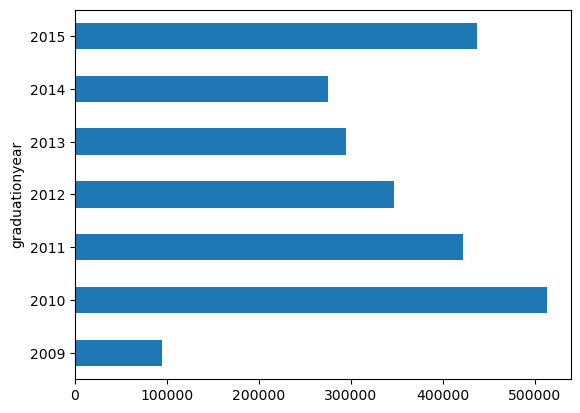

In [200]:
fresher_cse.groupby('graduationyear')['salary'].mean().plot(kind='barh')

In [201]:
fresher_cse.groupby('graduationyear')['salary'].mean().sort_values(ascending=False)

graduationyear
2010    513295.454545
2015    436607.142857
2011    422062.500000
2012    346748.251748
2013    294759.358289
2014    274917.763158
2009     95000.000000
Name: salary, dtype: float64

In [202]:
fresher_cse['groups'].value_counts()

groups
software engineer                     147
software developer                     74
system engineer                        32
java software engineer                 31
java developer                         29
                                     ... 
software quality assurance analyst      1
systems administrator                   1
web designer and seo                    1
data analyst                            1
game developer                          1
Name: count, Length: 143, dtype: int64

In [203]:
fresher_cse

,salary,doj,dol,designation,jobcity,gender,dob,12graduation,12percentage,degree,specialization,collegegpa,collegestate,graduationyear,english,logical,quant,domain,computerprogramming,electronicsandsemicon,computerscience,mechanicalengg,electricalengg,telecomengg,civilengg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,groups
3,1100000,2011-07-01,2016-03-01,senior software engineer,gurgaon,m,1989-12-05,2007,83.60,B.Tech/B.E.,computer engineering,74.64,Delhi,2011,635,585,625,0.974396,615.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0464,0.3448,-0.3440,-0.4078,-0.9194,senior software engineer
6,300000,2014-08-01,2015-05-01,java software engineer,bangaluru,m,1993-02-01,2010,67.50,B.Tech/B.E.,computer science & engineering,72.98,Karnataka,2014,590,435,380,0.356536,405.0,NaN,346.0,NaN,NaN,NaN,NaN,1.7081,-0.1054,-1.0379,-2.0092,-1.0872,java software engineer
20,320000,2010-11-01,2012-09-01,software engineer,bangaluru,f,1988-07-25,2006,84.63,B.Tech/B.E.,computer engineering,78.15,Karnataka,2010,455,535,445,0.635979,445.0,NaN,NaN,NaN,NaN,NaN,NaN,-0.1082,0.9688,0.5269,-0.2902,0.3444,software engineer
24,335000,2014-06-01,2015-06-01,programmer analyst,hyderabad,m,1993-06-28,2010,90.00,B.Tech/B.E.,computer science & engineering,76.00,Telangana,2014,625,555,630,0.356536,475.0,NaN,346.0,NaN,NaN,NaN,NaN,0.4155,0.8027,0.1357,-0.9950,-0.6692,programmer analyst
25,435000,2012-09-01,2016-03-01,systems analyst,gurgaon,f,1991-03-02,2008,82.80,B.Tech/B.E.,computer science & engineering,78.00,Haryana,2012,575,585,575,0.744758,565.0,NaN,438.0,NaN,NaN,NaN,NaN,0.0464,1.2028,-0.9245,0.5323,-0.2875,systems analyst
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3975,300000,2014-07-01,2015-04-01,game developer,noida,m,1991-06-03,2009,76.00,B.Tech/B.E.,computer science & engineering,63.00,Uttar Pradesh,2014,720,455,535,0.968237,605.0,NaN,NaN,NaN,NaN,NaN,NaN,0.5591,0.5454,0.1637,0.3995,0.4805,game developer
3979,550000,2013-07-01,2014-04-01,software engineer,bangaluru,m,1989-07-22,2006,65.66,M.Tech./M.E.,computer engineering,77.50,Uttar Pradesh,2013,395,435,645,0.990009,655.0,NaN,NaN,NaN,NaN,NaN,NaN,-0.5719,0.5008,-0.4891,0.4148,-1.2354,software engineer
3984,480000,2011-12-01,2016-03-01,software engineer,gurgaon,f,1990-01-18,2007,83.80,B.Tech/B.E.,computer engineering,70.00,Haryana,2011,535,455,525,0.843124,515.0,NaN,NaN,NaN,NaN,NaN,NaN,-0.2628,0.1888,0.3817,-0.2902,1.6082,software engineer
3989,300000,2014-09-01,2016-03-01,software engineer,bangaluru,m,1991-11-23,2010,82.55,B.Tech/B.E.,computer science & engineering,80.00,Karnataka,2014,500,480,500,0.356536,465.0,NaN,346.0,NaN,NaN,NaN,NaN,0.1282,0.0459,1.2396,1.0333,0.6721,software engineer


In [204]:
# Bivariate Analysis

<Axes: xlabel='specialization'>

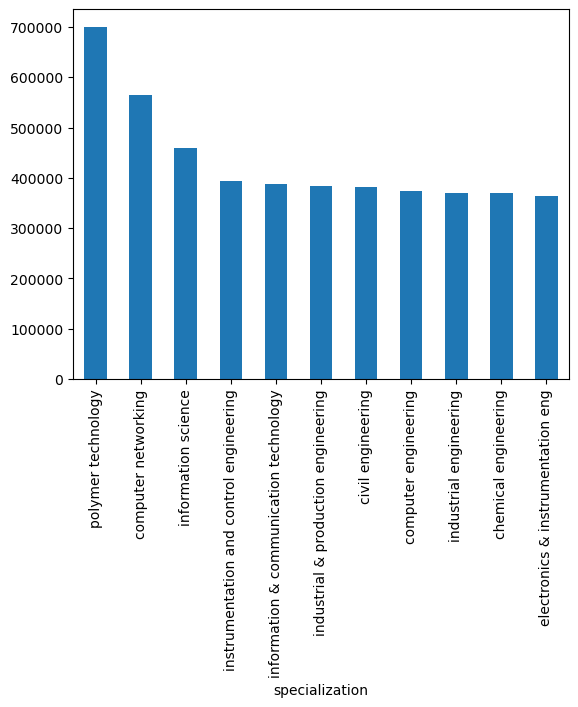

In [211]:
# top 11 specialization with highest mean salary 

df.groupby('specialization')['salary'].mean().sort_values(ascending=False)[0:11].plot(kind='bar')

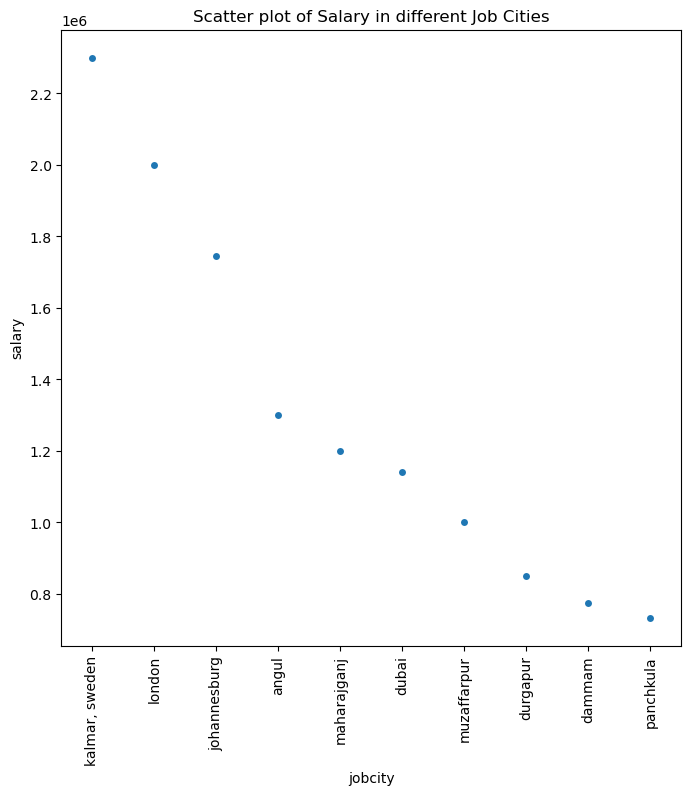

In [219]:
# salary vs jobcity
city = df.groupby('jobcity')['salary'].mean().sort_values(ascending=False)[0:10].reset_index()
# Assuming 'df' is your DataFrame and it has columns 'jobcity' and 'salary'
plt.figure(figsize=(8,8))
sns.stripplot(x="jobcity", y="salary", data=city, jitter=True)
plt.xticks(rotation=90) # Rotates X-Axis Ticks by 90-degrees
plt.title('Scatter plot of Salary in different Job Cities')
plt.show()

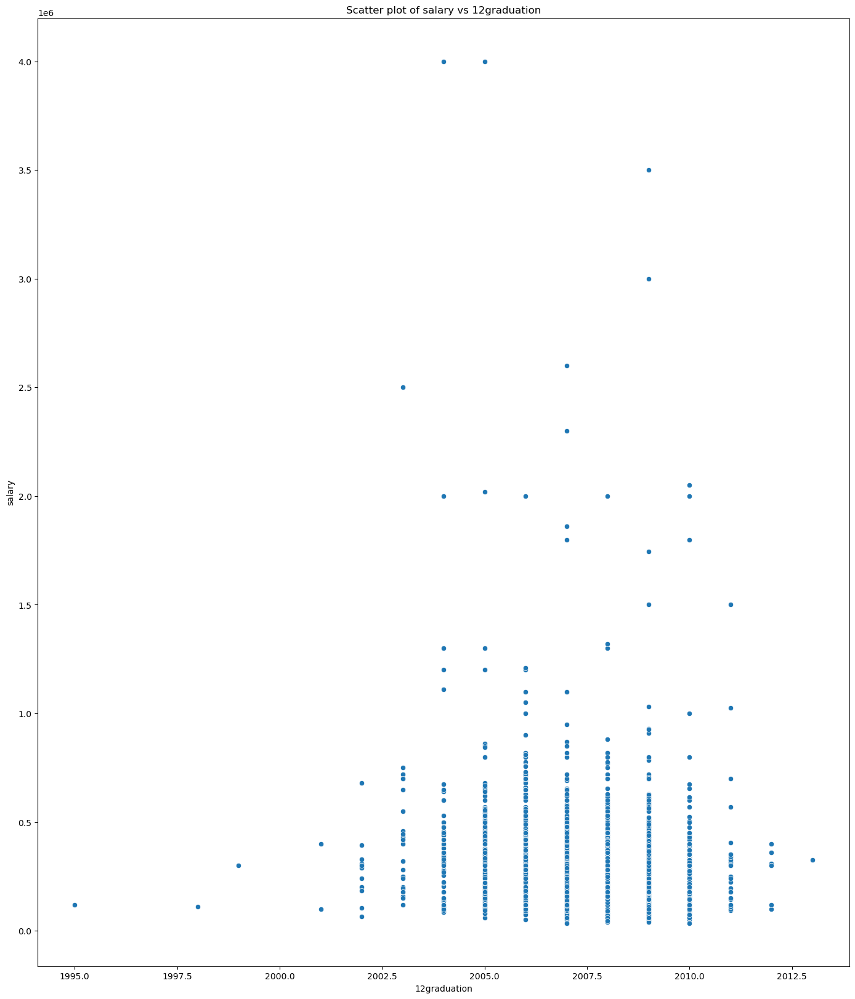

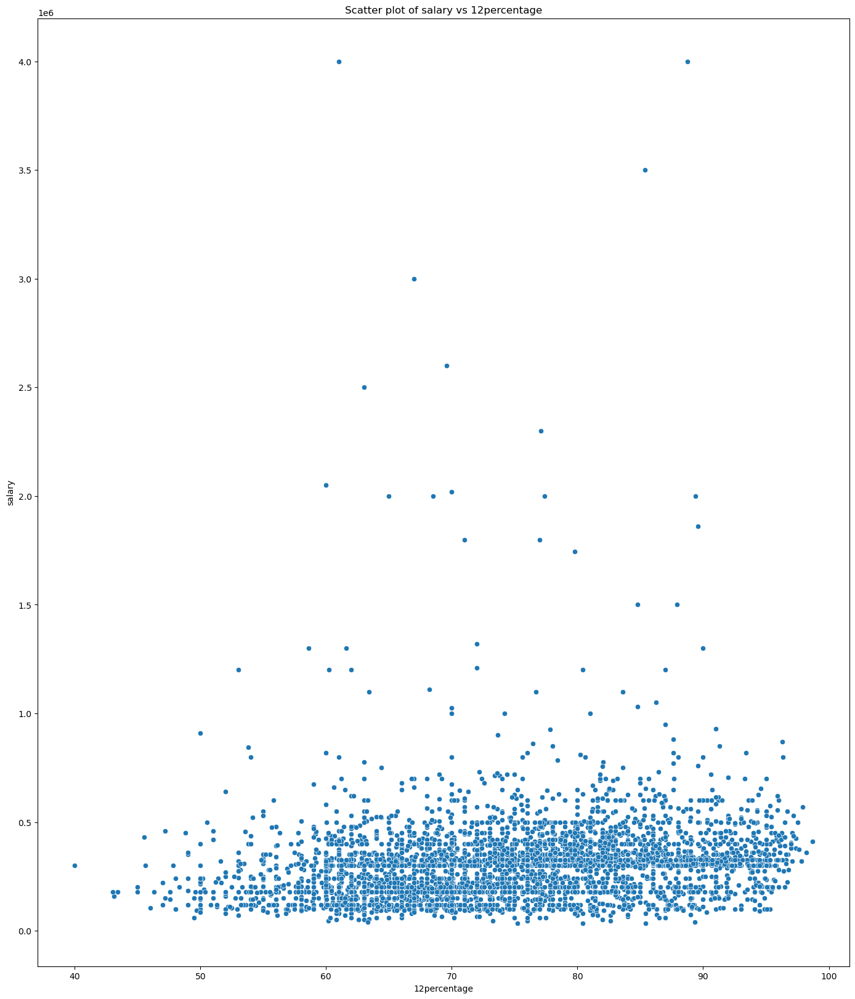

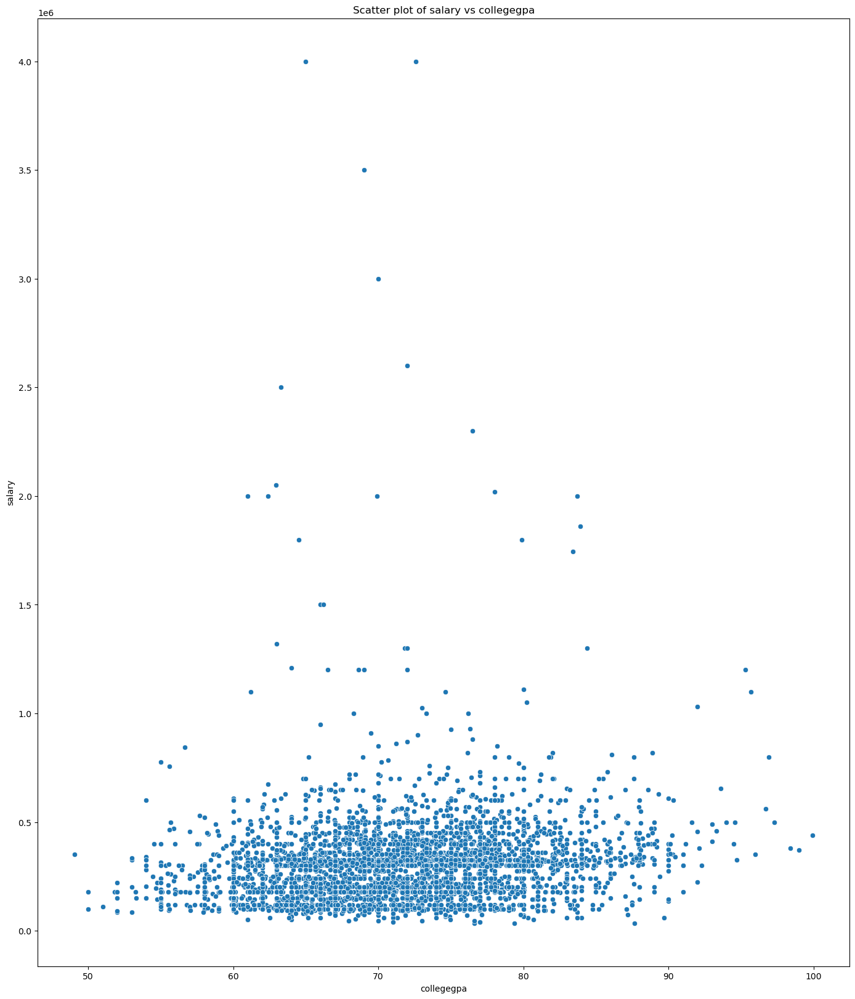

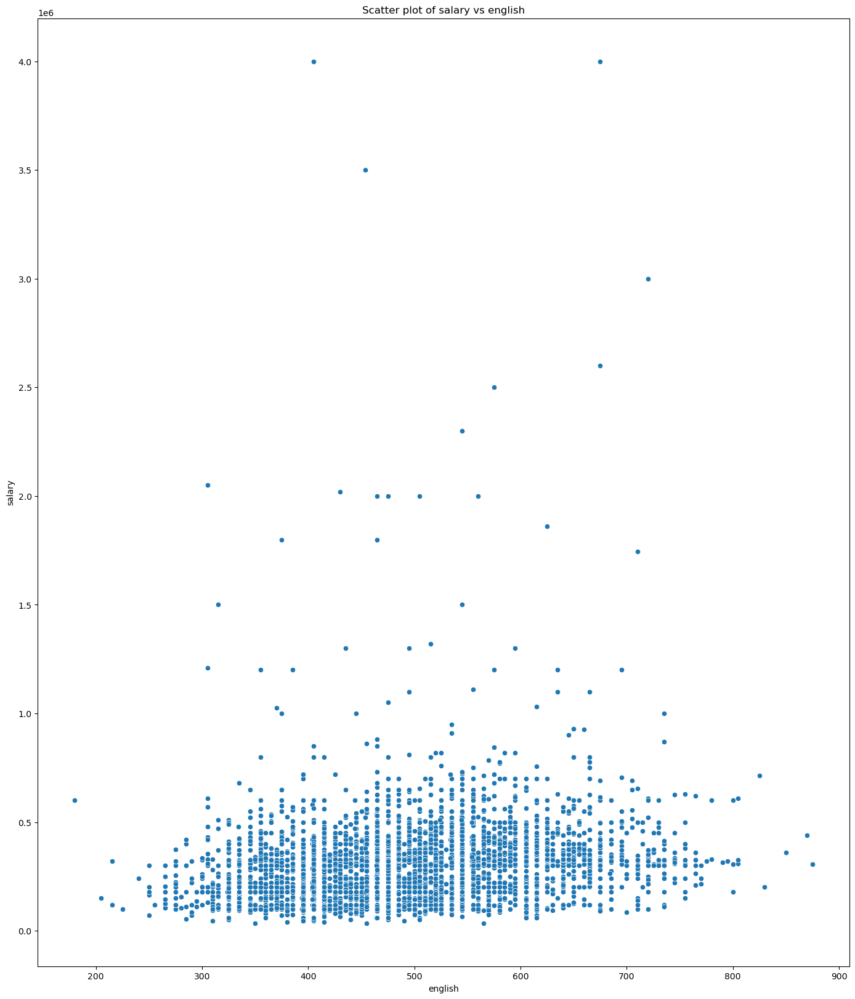

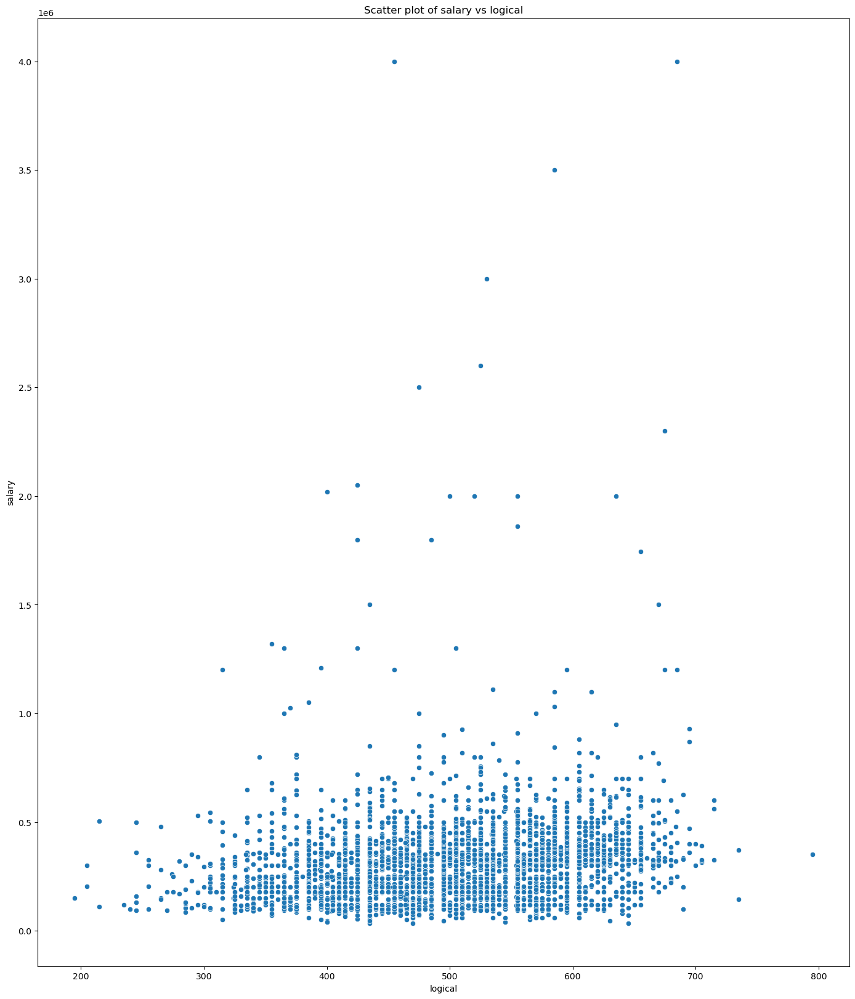

...

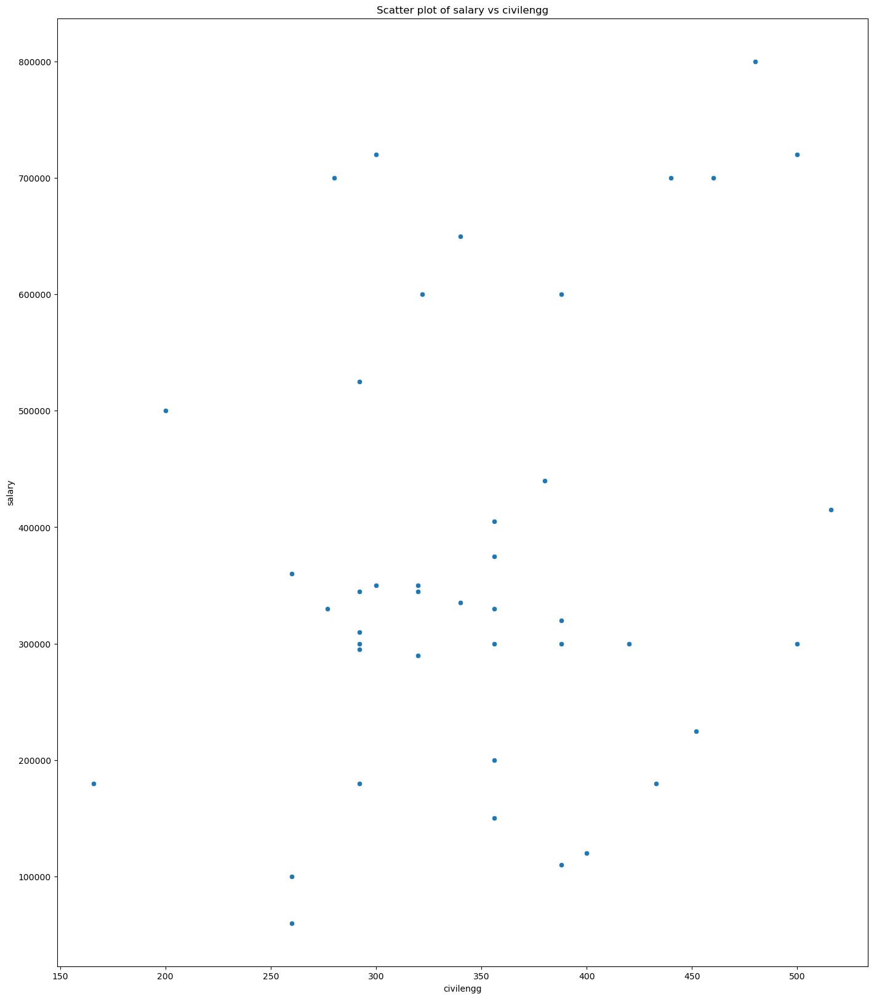

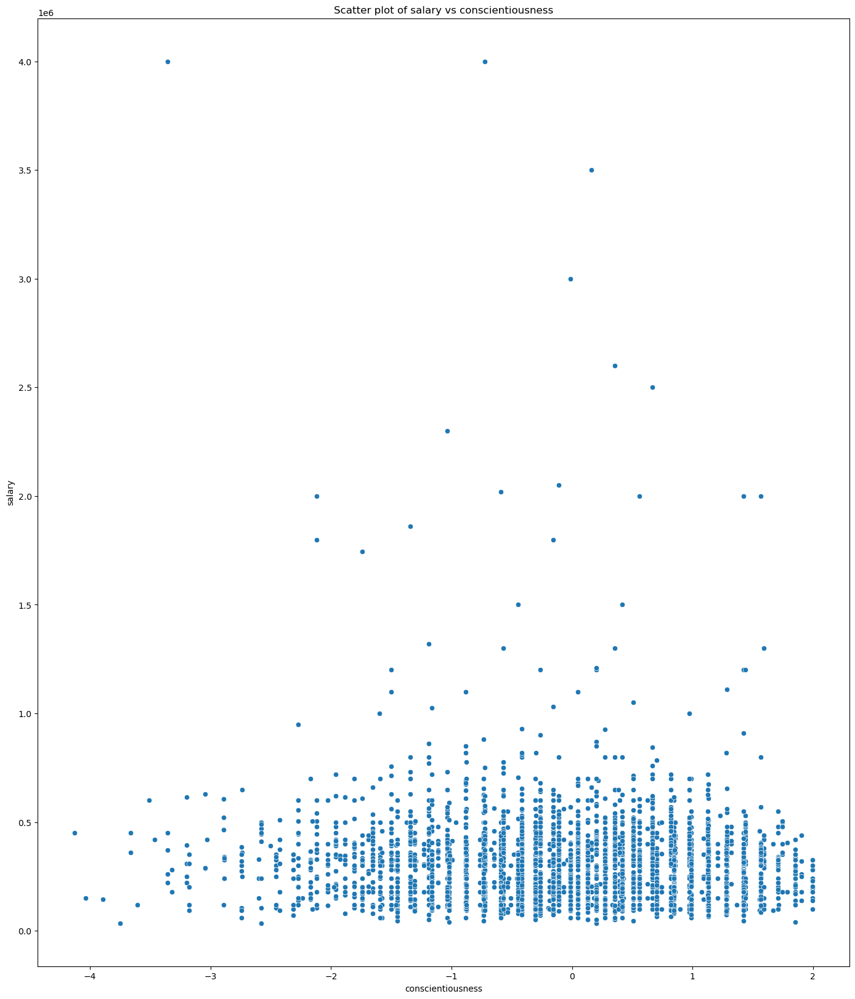

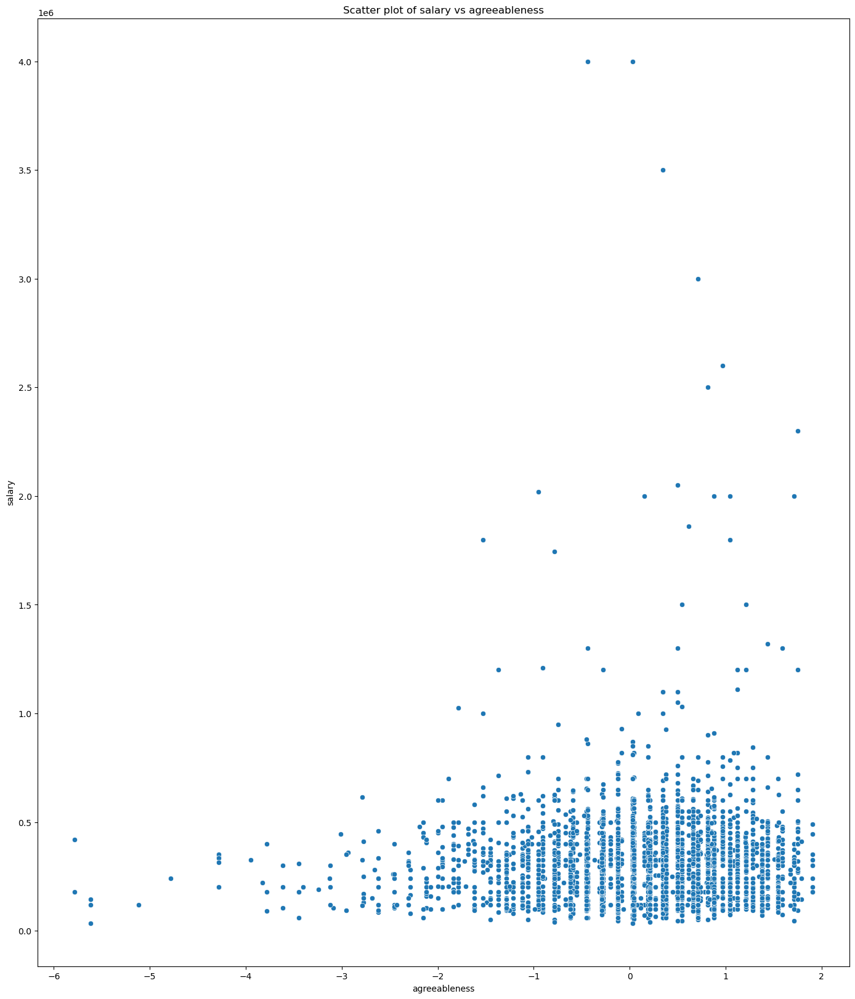

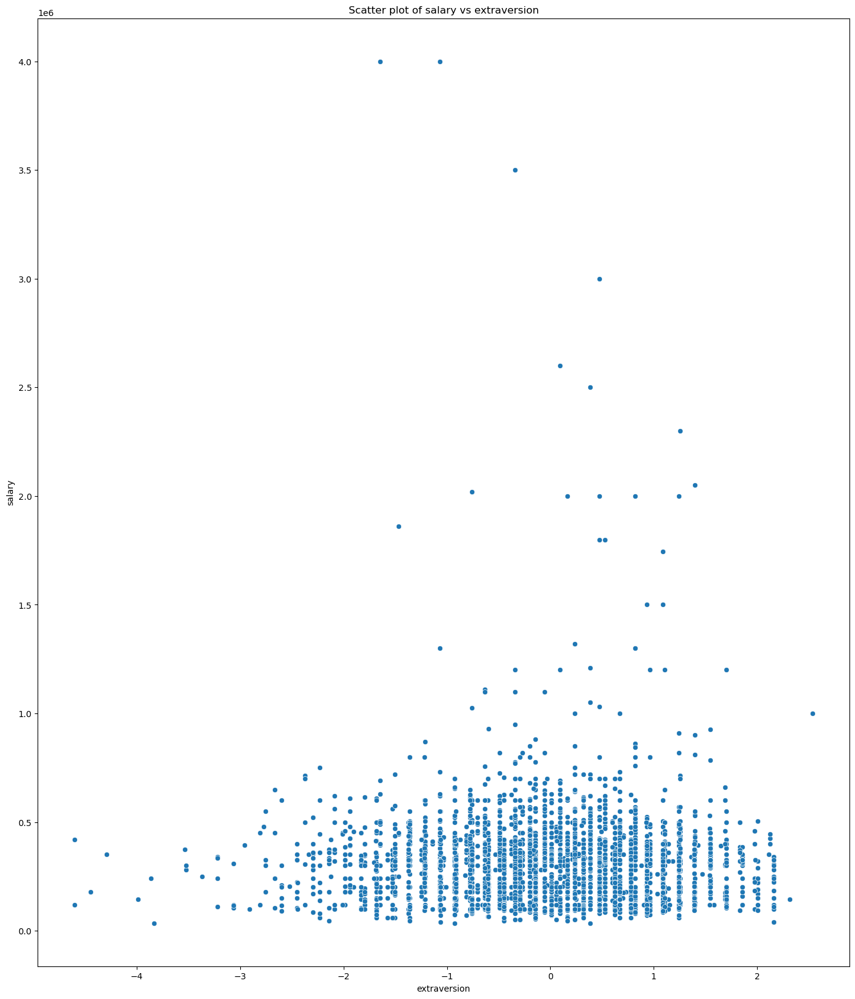

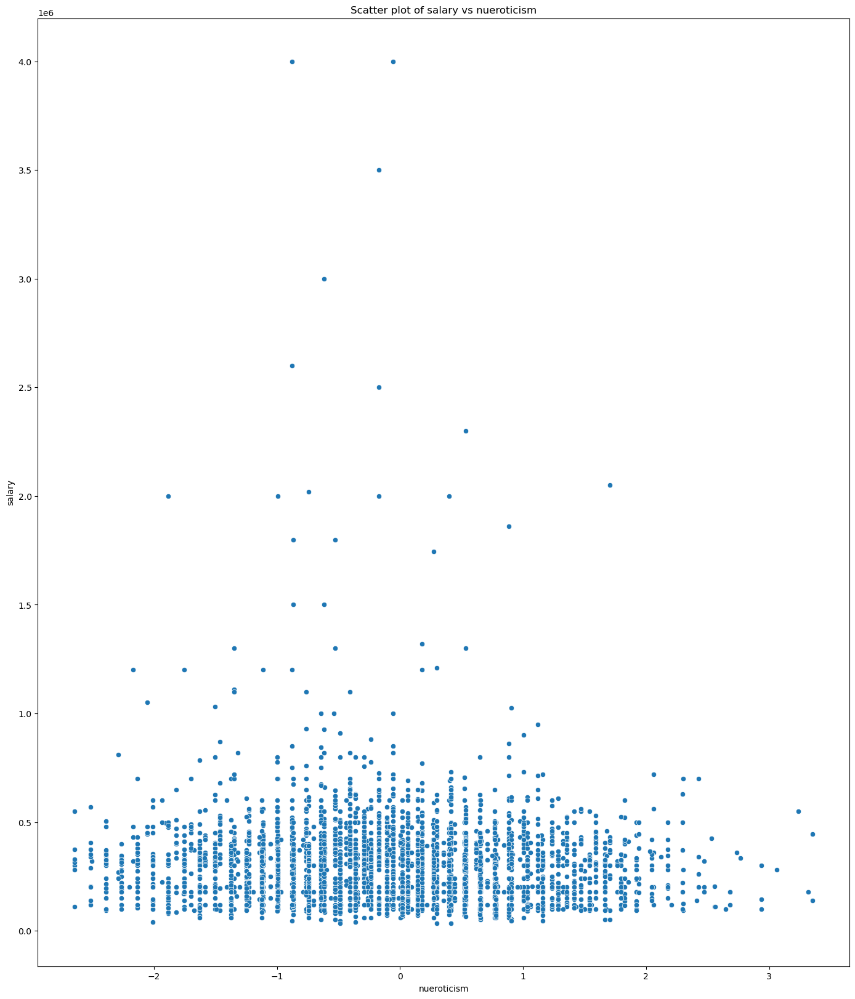

In [225]:
# numerical vs numerical
for e in numerical_cols[1:-1]:
    plt.figure(figsize=(5,5))
    sns.scatterplot(x=e, y="salary", data=df)
    plt.title(f'Scatter plot of salary vs {e}')
    plt.show()

In [220]:
numerical_cols

['salary',
 '12graduation',
 '12percentage',
 'collegegpa',
 'english',
 'logical',
 'quant',
 'domain',
 'computerprogramming',
 'electronicsandsemicon',
 'computerscience',
 'mechanicalengg',
 'electricalengg',
 'telecomengg',
 'civilengg',
 'conscientiousness',
 'agreeableness',
 'extraversion',
 'nueroticism',
 'openess_to_experience']

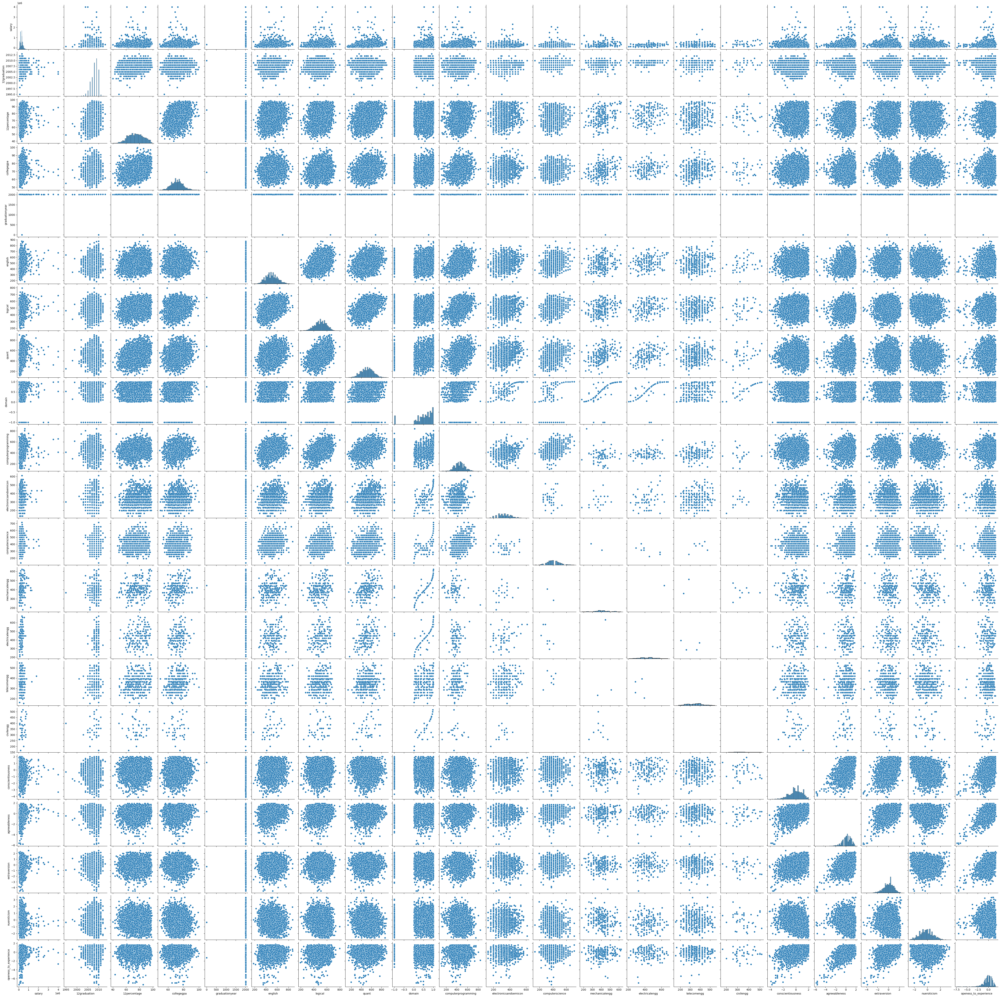

In [226]:
sns.pairplot(df)

# Research Question:

       Times of India article dated Jan 18, 2019 states that “After doing your Computer Science Engineering if you take up jobs as a Programming Analyst, Software Engineer, Hardware Engineer and Associate Engineer you can earn up to 2.5-3 lakhs as a fresh graduate.” Testing this claim with the data released by Aspiring Minds.

# Null Hypothesis : $$ H_0 : \mu >= 2.5  or  \mu <=3 $$

# Alterative Hypothesis : $$ H_1 : \mu < 2.5  or \mu > 3 $$

In [227]:
sample = list(fresher_cse['salary'].sample(n=40,random_state = 12))
print(sample)

[530000, 105000, 320000, 95000, 800000, 430000, 400000, 350000, 700000, 500000, 315000, 240000, 555000, 200000, 300000, 325000, 180000, 240000, 325000, 180000, 350000, 325000, 450000, 400000, 205000, 300000, 105000, 600000, 100000, 300000, 325000, 520000, 120000, 150000, 325000, 300000, 650000, 300000, 335000, 170000]


In [228]:
sample_mean = sum(sample)/len(sample) # average of the sample

print(sample_mean)

sample_std = pd.Series(sample).std()

print(sample_std)


335500.0
170421.04721346285


In [229]:
n = len(sample)
print(n)

pop_mean = 275000

40


In [230]:
# defining a function to calculate the t score
def tscore(sample_mean,pop_mean,sample_std,sample_size):
    t = (sample_mean - pop_mean)/(sample_std/sample_size**0.5)
    return t

In [231]:
# calculating the t value

tscor = tscore(sample_mean,27500,sample_std,n)

print(tscor)

11.430296143080133


In [232]:
# applying one sample t score test and calculating t critical value

In [233]:
from scipy.stats import t,norm

In [234]:
confidence = 0.95
alpha = 1 - confidence

t_critical = t.ppf(1 - alpha/2,df=n-1) # two tail t test

print('t_critical :',t_critical)

t_critical : 2.022690911734728


In [235]:
# calculating the t_critical_intercepts

t_left = pop_mean + (- t_critical * (sample_std/n**0.5))
t_right = pop_mean + ( t_critical * (sample_std/n**0.5))

print(t_left,t_right)

220496.70515829534 329503.29484170466


Text(335500.0, 2, 'x_bar')

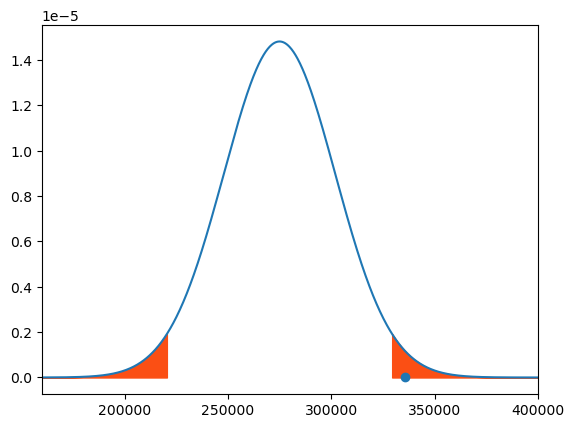

In [236]:
# plotting the graph

x_min = 160000
x_max = 400000

x = np.linspace(x_min,x_max,1000)
y = norm.pdf(x,pop_mean,sample_std/n**0.5)
plt.xlim(x_min,x_max)
plt.plot(x,y)


# shading the rejection region
x1 = np.linspace(x_min,t_left,1000)
y1 = norm.pdf(x1,pop_mean,sample_std/n**0.5)
plt.fill_between(x1,y1,color='#fb4f14')

x2 = np.linspace(t_right,x_max,1000)
y2 = norm.pdf(x2,pop_mean,sample_std/n**0.5)
plt.fill_between(x2,y2,color='#fb4f14')

# scatter the sample_mean on to the graph
plt.scatter(sample_mean,0)
plt.annotate('x_bar',(sample_mean,2))


In [237]:
# conclusion 
if tscor > t_critical:
    print('tscore :',tscor)
    print('t_critical :',t_critical)
    print('Reject Null Hypothesis')
else:
    print('tscore :',tscore)
    print('t_critical :',t_critical)
    print(' Fail To Reject Null Hypothesis')    

tscore : 11.430296143080133
t_critical : 2.022690911734728
Reject Null Hypothesis


In [238]:
p_value = 2 * (10 - norm.cdf(np.abs(tscor)))

print('p_value :',p_value)

if p_value > alpha :
    print('alpha :',alpha)
    print('p_value :',p_value)
    print('Reject Null Hypothesis')
else:
    print('alpha :',alpha)
    print('p_value :',p_value)
    print('Fail To Reject Null Hypothesis')

p_value : 18.0
alpha : 0.050000000000000044
p_value : 18.0
Reject Null Hypothesis


In [239]:
 # Individual designation hypothesis testing

In [240]:
fresher_cse['groups'].value_counts()

groups
software engineer                     147
software developer                     74
system engineer                        32
java software engineer                 31
java developer                         29
                                     ... 
software quality assurance analyst      1
systems administrator                   1
web designer and seo                    1
data analyst                            1
game developer                          1
Name: count, Length: 143, dtype: int64

# Is there a relationship between gender and the specialization

In [242]:
from scipy.stats import chi2
from scipy.stats import chi2_contingency

In [243]:
observation = pd.crosstab(df['specialization'],df['gender'],margins = True)

In [244]:
observation

gender,f,m,All
specialization,,,
aeronautical engineering,1,2,3
applied electronics and instrumentation,2,7,9
automobile/automotive engineering,0,5,5
biomedical engineering,2,0,2
biotechnology,9,6,15
ceramic engineering,0,1,1
chemical engineering,1,8,9
civil engineering,6,23,29
computer and communication engineering,0,1,1


In [245]:
# chi2_contigency returns chi2 test statistic, p-value, degree of freedoms, expected frequencies

chi2_contingency(observation)

Chi2ContingencyResult(statistic=104.46891913608454, pvalue=0.1763573393226839, dof=92, expected_freq=array([[7.18109055e-01, 2.28189095e+00, 3.00000000e+00],
       [2.15432716e+00, 6.84567284e+00, 9.00000000e+00],
       [1.19684842e+00, 3.80315158e+00, 5.00000000e+00],
       [4.78739370e-01, 1.52126063e+00, 2.00000000e+00],
       [3.59054527e+00, 1.14094547e+01, 1.50000000e+01],
       [2.39369685e-01, 7.60630315e-01, 1.00000000e+00],
       [2.15432716e+00, 6.84567284e+00, 9.00000000e+00],
       [6.94172086e+00, 2.20582791e+01, 2.90000000e+01],
       [2.39369685e-01, 7.60630315e-01, 1.00000000e+00],
       [5.84062031e+01, 1.85593797e+02, 2.44000000e+02],
       [1.43621811e+02, 4.56378189e+02, 6.00000000e+02],
       [2.39369685e-01, 7.60630315e-01, 1.00000000e+00],
       [4.78739370e-01, 1.52126063e+00, 2.00000000e+00],
       [1.78091046e+02, 5.65908954e+02, 7.44000000e+02],
       [1.43621811e+00, 4.56378189e+00, 6.00000000e+00],
       [2.39369685e-01, 7.60630315e-01, 1.00

In [246]:
# Computing chi2 test statistic, p-value, degree of freedoms

chi2_test_stat = chi2_contingency(observation)[0]

print('chi2_test_stat :',chi2_test_stat)

pval = chi2_contingency(observation)[1]

print('p_value :',pval)

dof = chi2_contingency(observation)[2]

print('degree of freedom :',dof)

chi2_test_stat : 104.46891913608454
p_value : 0.1763573393226839
degree of freedom : 92


In [247]:
confidence_level = 0.95

alpha = 1 - confidence_level

chi2_critical = chi2.ppf(1 - alpha, dof)

chi2_critical

115.38978970826685

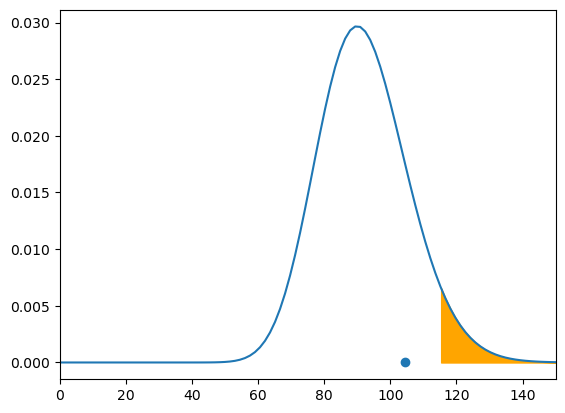

In [248]:
# Defining the x minimum and x maximum
x_min = 0
x_max = 150

# Ploting the graph and setting the x limits
x = np.linspace(x_min, x_max, 100)
y = chi2.pdf(x, dof)
plt.xlim(x_min, x_max)
plt.plot(x, y)


# Setting Chi2 Critical value 
chi2_critical_right = chi2_critical

# Shading the right rejection region
x1 = np.linspace(chi2_critical_right, x_max, 100)
y1 = chi2.pdf(x1, dof)
plt.fill_between(x1, y1, color='orange')

plt.scatter(chi2_test_stat,0)


In [249]:
if(chi2_test_stat > chi2_critical):
    print("Reject Null Hypothesis")
else:
    print("Fail to Reject Null Hypothesis")

Fail to Reject Null Hypothesis


In [250]:
if(pval < alpha):
    print("Reject Null Hypothesis")
else:
    print("Fail to Reject Null Hypothesis")

Fail to Reject Null Hypothesis
